In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import LabelEncoder
from scipy.stats import zscore
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier


from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
import joblib
import warnings
warnings.filterwarnings('ignore')

In [3]:
#importing the  dataset
df=pd.read_csv("Automobile_insurance_fraud.csv")

In [67]:
pd.set_option("display.max_rows",None)
pd.set_option('display.max_columns', None)


In [4]:
df.head(20)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
5,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,FEMALE,PhD,tech-support,bungie-jumping,unmarried,0,0,02-01-2015,Multi-vehicle Collision,Rear Collision,Major Damage,Fire,SC,Arlington,8973 Washington St,19,3,NO,0,2,NO,64100,6410,6410,51280,Saab,95,2003,Y,NaN
6,137,34,413978,04-06-2000,IN,250/500,1000,1333.35,0,441716,MALE,PhD,prof-specialty,board-games,husband,0,-77000,13-01-2015,Multi-vehicle Collision,Front Collision,Minor Damage,Police,NY,Springfield,5846 Weaver Drive,0,3,?,0,0,?,78650,21450,7150,50050,Nissan,Pathfinder,2012,N,NaN
7,165,37,429027,03-02-1990,IL,100/300,1000,1137.03,0,603195,MALE,Associate,tech-support,base-jumping,unmarried,0,0,27-02-2015,Multi-vehicle Collision,Front Collision,Total Loss,Police,VA,Columbus,3525 3rd Hwy,23,3,?,2,2,YES,51590,9380,9380,32830,Audi,A5,2015,N,NaN
8,27,33,485665,05-02-1997,IL,100/300,500,1442.99,0,601734,FEMALE,PhD,other-service,golf,own-child,0,0,30-01-2015,Single Vehicle Collision,Front Collision,Total Loss,Police,WV,Arlington,4872 Rock Ridge,21,1,NO,1,1,YES,27700,2770,2770,22160,Toyota,Camry,2012,N,NaN
9,212,42,636550,25-07-2011,IL,100/300,500,1315.68,0,600983,MALE,PhD,priv-house-serv,camping,wife,0,-39300,05-01-2015,Single Vehicle Collision,Rear Collision,Total Loss,Other,NC,Hillsdale,3066 Francis Ave,14,1,NO,2,1,?,42300,4700,4700,32900,Saab,92x,1996,N,NaN


In [5]:
#Checking shape of dataset
df.shape

(1000, 40)

we can see there are 1000 rows and 40 columns in the dataset

In [6]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

we can observe the column name _c39 has only nulll values ,so we can drop that column.

In [4]:
#we have 2 columns of dates in the dfset policy_bind_date and incident_date


#changing Date to datetime format for policy bind_date
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])
df["policy_bind_Month"]=df["policy_bind_date"].dt.month
df["policy_bind_Day"]=df["policy_bind_date"].dt.day
df["policy_bind_Year"]=df["policy_bind_date"].dt.year

#we can drop policy_bind_date since we got its data
df.drop('policy_bind_date',axis=1,inplace=True)


#changing Date to datetime format for incident_Date
df['incident_date']=pd.to_datetime(df['incident_date'])
df["incident_Month"]=df["incident_date"].dt.month
df["incident_Day"]=df["incident_date"].dt.day
df["incident_Year"]=df["incident_date"].dt.year

#we can drop incident_date since we got its data
df.drop('incident_date',axis=1,inplace=True)

In [11]:
df.months_as_customer.value_counts()

194    8
128    7
254    7
140    7
210    7
230    7
285    7
101    7
239    6
126    6
259    6
163    6
156    6
257    6
255    6
147    6
65     6
61     6
222    6
289    6
246    6
290    6
245    6
295    6
107    6
286    5
284    5
80     5
78     5
85     5
269    5
186    5
266    5
108    5
253    5
103    5
27     5
298    5
143    5
134    5
137    5
165    5
241    5
264    5
169    5
211    5
235    5
233    4
142    4
209    4
32     4
252    4
122    4
270    4
398    4
280    4
124    4
371    4
267    4
274    4
41     4
219    4
225    4
123    4
84     4
228    4
261    4
120    4
328    4
271    4
204    4
146    4
166    4
64     4
303    4
97     4
152    4
130    4
150    4
160    4
70     4
180    4
121    4
212    4
256    4
297    4
276    4
195    4
229    4
175    4
96     4
283    4
215    4
91     4
154    4
22     4
119    4
234    3
330    3
1      3
272    3
446    3
110    3
458    3
190    3
177    3
86     3
111    3
294    3
73     3
75     3
2

we can see large number of month values in the dataset varying in the dataset

In [12]:
df.age.value_counts()

43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64

We can see that the age varies from 19 to 64 in the dataset

In [13]:
df.policy_number.nunique()

1000

In [14]:
#policy_number is a single type unique data. We can drop it as it is useless data as it wont have any relation in the model

df.drop('policy_number',axis=1,inplace=True)

In [15]:
df.policy_state.value_counts()

OH    352
IL    338
IN    310
Name: policy_state, dtype: int64

we can see variables with OH having the highest data and least in IN in the dataset

In [16]:
df.policy_csl.value_counts()

250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64

we can see 3 types of Policy Coverage for the customers and all the classifications are more in the range of 300 to 351 in the column

In [17]:
df.policy_deductable.value_counts()

1000    351
500     342
2000    307
Name: policy_deductable, dtype: int64

we can see the 3 classification of policy deduction in the dataset and they are more in count for 1000 and least for 500 classification

In [18]:
df.policy_annual_premium.value_counts()

1558.29    2
1215.36    2
1362.87    2
1073.83    2
1389.13    2
1074.07    2
1374.22    2
1524.45    2
1281.25    2
1230.69    1
1223.39    1
625.08     1
1373.21    1
1625.65    1
1295.63    1
1459.96    1
1219.94    1
1064.49    1
959.83     1
1767.02    1
1285.01    1
1422.95    1
1539.06    1
671.01     1
988.06     1
1740.57    1
1540.91    1
1381.88    1
1446.98    1
1220.86    1
948.10     1
1471.24    1
1157.97    1
566.11     1
1060.88    1
1450.98    1
895.14     1
1312.22    1
1307.68    1
1390.89    1
1124.69    1
1520.78    1
1439.90    1
1609.11    1
1358.91    1
1295.87    1
1161.03    1
1441.06    1
1366.60    1
1097.99    1
1464.42    1
1543.68    1
1133.27    1
1172.82    1
1148.58    1
1616.26    1
1398.94    1
1238.92    1
968.46     1
1045.12    1
1537.33    1
912.30     1
1007.28    1
1556.17    1
1189.98    1
1576.41    1
1406.91    1
1203.81    1
1216.24    1
1122.95    1
935.77     1
1192.04    1
990.11     1
1422.21    1
914.85     1
1123.84    1
838.02     1

we can see that the policy_annual_premium is in the range of 433.33 and 2047.59 in the entire dataset

In [19]:
df.umbrella_limit.value_counts()

 0           798
 6000000      57
 5000000      46
 4000000      39
 7000000      29
 3000000      12
 8000000       8
 9000000       5
 2000000       3
 10000000      2
-1000000       1
Name: umbrella_limit, dtype: int64

We acn see that  amount of coverage provided by an umbrella insurance policy is largely varied in the datset and outliers can be seen

In [20]:
df.insured_zip.value_counts()

477695    2
469429    2
446895    2
431202    2
456602    2
466132    1
452218    1
608982    1
459630    1
453193    1
435809    1
462804    1
431968    1
600127    1
430878    1
466498    1
434150    1
460579    1
439964    1
442142    1
608807    1
433153    1
436560    1
436784    1
430621    1
601574    1
433853    1
453164    1
613931    1
607458    1
463835    1
613945    1
432699    1
478486    1
440680    1
479655    1
606988    1
475391    1
440720    1
606942    1
446971    1
470538    1
601177    1
451470    1
438529    1
469742    1
435534    1
442239    1
468986    1
453719    1
609949    1
475524    1
617804    1
613399    1
453400    1
615767    1
615311    1
468470    1
461383    1
457727    1
613327    1
614941    1
472922    1
613119    1
613849    1
432218    1
619470    1
620507    1
614867    1
609898    1
450702    1
600418    1
457793    1
470190    1
603733    1
465136    1
611723    1
608963    1
454139    1
447560    1
444378    1
616583    1
455913    1
4543

We can see the insured_zip varies from  430104 to 620962 in the dataset

In [21]:
df.insured_sex.value_counts()

FEMALE    537
MALE      463
Name: insured_sex, dtype: int64

We can see High count of data in Female with 537 and least in MAle with 463 in the datset

In [22]:
df.insured_education_level.value_counts()

JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64

In [23]:
df.insured_occupation.value_counts()

machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64

We can see 14 classification in the column and highest count of 93 is on machine-op-inspct in insured_occupation
and least in farming-fishing in insured_occupation with a count of 53 
    


In [24]:
df.insured_hobbies.value_counts()

reading           64
exercise          57
paintball         57
bungie-jumping    56
movies            55
golf              55
camping           55
kayaking          54
yachting          53
hiking            52
video-games       50
skydiving         49
base-jumping      49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34
Name: insured_hobbies, dtype: int64


We can see 20 classification in the column and highest count of 64 is on reading  in insured_hobbies 
and least in basketball in insured_hobbies with a count of 34

In [25]:
df.insured_relationship.value_counts()

own-child         183
other-relative    177
not-in-family     174
husband           170
wife              155
unmarried         141
Name: insured_relationship, dtype: int64

We can observe 6 classification in the column and highest count of 183 is on own-child
in insured_relationship and least in unmarried  in insured_relationship with a count of 141

In [26]:
df['capital-gains'].value_counts()

0         508
46300       5
51500       4
68500       4
55600       3
49700       3
51700       3
56700       3
47600       3
44000       3
36900       3
49900       3
75800       3
37900       3
45700       3
59600       3
38600       3
51400       3
51100       3
45500       3
35100       3
48900       3
67800       3
52800       3
42900       3
29300       3
63600       3
63100       3
52600       3
46700       3
58500       3
43700       3
53200       3
57800       2
53100       2
47400       2
55400       2
26900       2
53300       2
65600       2
52100       2
44400       2
47500       2
46100       2
60300       2
39900       2
53000       2
35000       2
32500       2
24000       2
62200       2
59900       2
66400       2
25000       2
64200       2
30400       2
57100       2
61600       2
50400       2
55100       2
53800       2
33500       2
50700       2
55300       2
52200       2
42200       2
49600       2
54500       2
38000       2
46500       2
44500       2
57500 

we can see that the capital-gains is in the range of 100500 to 0 in the entire dataset

In [27]:
df['capital-loss'].value_counts()

 0         475
-31700       5
-53700       5
-50300       5
-45300       4
-51000       4
-32800       4
-53800       4
-49200       4
-31400       4
-61400       4
-42700       3
-78600       3
-62400       3
-41200       3
-50000       3
-51800       3
-33300       3
-56200       3
-66200       3
-49400       3
-53300       3
-44500       3
-61000       3
-46900       3
-41400       3
-67800       3
-45100       3
-58900       3
-51500       3
-58400       3
-68200       3
-49500       3
-49000       3
-45800       3
-67400       3
-49300       3
-39300       3
-48800       3
-64500       3
-55600       3
-40900       2
-59500       2
-44800       2
-39100       2
-44400       2
-15700       2
-54600       2
-32300       2
-33100       2
-52100       2
-63900       2
-47100       2
-52600       2
-63700       2
-72100       2
-70300       2
-32500       2
-49700       2
-70900       2
-72500       2
-39700       2
-35200       2
-48700       2
-42100       2
-48500       2
-65300    

we can see that the capital-loss is in the range of 111100 to 0 in the entire dataset

In [28]:
df.incident_type.value_counts()

Multi-vehicle Collision     419
Single Vehicle Collision    403
Vehicle Theft                94
Parked Car                   84
Name: incident_type, dtype: int64

We can observe 4 classification in the column and highest count of 419 is on Multi-vehicle Collision in incident_type
and least in Parked Car in incident_type with a count of 84

In [29]:
df.collision_type.value_counts()

Rear Collision     292
Side Collision     276
Front Collision    254
?                  178
Name: collision_type, dtype: int64

We can observe 4 classification in the column and highest count of 292 is on Rear Collision in collision_type 
and least in ?  collision_type with a count of 178

In [30]:
df.incident_severity.value_counts()

Minor Damage      354
Total Loss        280
Major Damage      276
Trivial Damage     90
Name: incident_severity, dtype: int64

We can observe 4 classification in the column and highest count of 354 is on Minor Damage in incident_severity and least in Trivial Damage in incident_severity with a count of 90

In [31]:
df.authorities_contacted.value_counts()

Police       292
Fire         223
Other        198
Ambulance    196
None          91
Name: authorities_contacted, dtype: int64

We can observe 5 classification in the column and highest count of 292 is on Police in authorities_contacted and
least in None in authorities_contacted with a count of 91

In [32]:
df.incident_state.value_counts()

NY    262
SC    248
WV    217
VA    110
NC    110
PA     30
OH     23
Name: incident_state, dtype: int64

We can observe 7 classification in the column and highest count of 262 is on NY in incident_state and
least in OH  in incident_state with a count of 23

In [33]:
df.incident_city.value_counts()

Springfield    157
Arlington      152
Columbus       149
Northbend      145
Hillsdale      141
Riverwood      134
Northbrook     122
Name: incident_city, dtype: int64

We can observe 7 classification in the column and highest count of 157 is on Springfield in incident_city and 
least in Northbrook in incident_city with a count of 122

In [34]:
df.incident_location.value_counts()

9935 4th Drive             1
4214 MLK Ridge             1
8548 Cherokee Ridge        1
2352 MLK Drive             1
9734 2nd Ridge             1
3122 Apache Drive          1
9816 Britain St            1
8214 Flute St              1
6259 Lincoln Hwy           1
4492 Andromedia Ave        1
6179 3rd Ridge             1
3799 Embaracadero Drive    1
5071 1st Lane              1
6574 4th Drive             1
2711 Britain Ave           1
7976 Britain Drive         1
3555 Francis Ridge         1
4995 Weaver Ridge          1
1515 Embaracadero St       1
2968 Andromedia Ave        1
9236 2nd Hwy               1
9639 Britain Ridge         1
9422 Washington Ridge      1
1213 4th Lane              1
3872 5th Drive             1
9397 5th Hwy               1
8876 1st St                1
3397 5th Ave               1
3263 Pine Ridge            1
8639 5th Hwy               1
4835 Britain Ridge         1
9562 4th Ridge             1
6834 1st Drive             1
1953 Sky Lane              1
4702 Texas Dri

In [35]:
df.incident_location.nunique()

1000

We can observe 1000 unique locations in the incident_location in the dataset.We can drop this column as it wont have any relation in the model

In [36]:
df.incident_hour_of_the_day.value_counts()

17    54
3     53
0     52
23    51
16    49
13    46
10    46
4     46
6     44
9     43
14    43
21    42
18    41
12    40
19    40
7     40
15    39
22    38
8     36
20    34
5     33
2     31
11    30
1     29
Name: incident_hour_of_the_day, dtype: int64

We can observe 24 unique  calues in the dataset and highest count of 54 is on 17 in incident_hour_of_the_day and
least in 1st hour in incident_hour_of_the_day with a count of 29

In [37]:
df.number_of_vehicles_involved.value_counts()

1    581
3    358
4     31
2     30
Name: number_of_vehicles_involved, dtype: int64

We can observe 4 classification in the column and highest count of 581 is on 1 in number_of_vehicles_involved and 
least in 2 in number_of_vehicles_involved with a count of 30

In [39]:
df.property_damage.value_counts()

?      360
NO     338
YES    302
Name: property_damage, dtype: int64

We can observe 3 classification in the column and highest count of 360 is on ? in property_damage 
and least in YES in property_damage with a count of 302

In [40]:
df.bodily_injuries.value_counts()

0    340
2    332
1    328
Name: bodily_injuries, dtype: int64

We can observe 3 classification in the column and highest count of  340 is on 0 in bodily_injuries 
and least in 1 in bodily_injuries with a count of 328

In [41]:
df.witnesses.value_counts()

1    258
2    250
0    249
3    243
Name: witnesses, dtype: int64

We can observe 4 classification in the column and highest count of 258 is on 1 in witnesses and
least in 3 in witnesses with a count of 243

In [42]:
df.police_report_available.value_counts()

?      343
NO     343
YES    314
Name: police_report_available, dtype: int64

We can observe 3 classification in the column and highest count of 343 is on ?  in police_report_available and
least in YES in police_report_available with a count of 314

In [43]:
df.total_claim_amount.value_counts()

59400     5
2640      4
70400     4
4320      4
44200     4
75400     4
60600     4
3190      4
58500     4
70290     4
5940      4
53680     3
56160     3
57700     3
55200     3
52800     3
53100     3
5060      3
5900      3
79800     3
84590     3
62920     3
69480     3
53460     3
55000     3
4700      3
4950      3
64350     3
58300     3
4620      3
6600      3
64800     3
50800     3
74200     3
53280     3
6400      3
69300     3
46200     3
77880     3
5000      3
6820      3
64080     3
7080      3
53400     3
64100     3
61490     3
77440     3
74700     3
67320     2
4900      2
46800     2
48000     2
66200     2
30700     2
64200     2
56320     2
76120     2
74360     2
62590     2
5170      2
52030     2
54240     2
59670     2
53600     2
64000     2
47300     2
5590      2
45100     2
61380     2
63240     2
61740     2
61050     2
5500      2
67800     2
6160      2
6120      2
48950     2
3600      2
82170     2
86130     2
66550     2
64400     2
6890      2
4149

We have 763 unique values in the column and the min value in the column total_claim_amount is 100 and max value is 114920 in the column

In [44]:
df.injury_claim.value_counts()

0        25
640       7
480       7
660       5
580       5
13520     5
1180      5
860       5
6340      5
780       5
5540      5
1240      4
6630      4
4420      4
940       4
900       4
7420      4
5000      4
600       4
10540     4
1300      4
680       4
5550      4
560       4
5590      3
5360      3
420       3
630       3
460       3
670       3
11940     3
12980     3
5190      3
11160     3
6620      3
12780     3
5710      3
10860     3
11380     3
960       3
6720      3
12300     3
7180      3
11700     3
1060      3
12800     3
15660     3
11040     3
7120      3
5850      3
4680      3
5340      3
13800     3
14080     3
5770      3
9920      3
4770      3
14000     3
7470      3
590       3
5940      3
11440     3
15120     3
6930      3
500       3
430       3
12820     3
520       3
300       3
6060      3
7080      3
6730      3
4200      3
6410      3
9880      3
5310      2
5780      2
5040      2
7040      2
5750      2
5380      2
12140     2
11960     2
5900

We have 638 unique values in the column and the min value in the 
column injury_claim is 0 and max value is 21450 in the column

In [45]:
df.property_claim.value_counts()

0        19
860       6
480       5
660       5
10000     5
640       5
650       5
11080     5
840       4
5310      4
6620      4
680       4
960       4
5340      4
7040      4
9360      4
13860     4
11100     4
5720      4
1180      4
580       4
590       4
4420      4
10520     4
7000      4
6340      4
780       4
6410      4
6330      4
6720      3
5220      3
470       3
5490      3
9540      3
620       3
14740     3
630       3
14840     3
1260      3
940       3
14120     3
10540     3
12220     3
280       3
720       3
6140      3
5770      3
7690      3
5850      3
500       3
920       3
6940      3
6760      3
450       3
10840     3
5270      3
13000     3
6800      3
7560      3
9600      3
15540     3
7420      3
7470      3
1060      3
11180     3
6060      3
1240      3
6390      3
320       3
10720     3
13260     3
7150      3
820       3
6860      3
13800     3
4730      3
6270      3
300       3
8400      3
5790      3
5710      3
11820     2
3720      2
6150

We have 626 unique values in the column and the min value in the column property_claim is 0 and
max value is 23670 in the column

In [46]:
df.vehicle_claim.value_counts()

5040     7
3360     6
52080    5
4720     5
3600     5
44800    5
33600    5
42720    4
41580    4
35000    4
41760    4
38850    4
46800    4
2940     4
45360    4
44520    3
2100     3
52290    3
2240     3
2730     3
3920     3
36540    3
25200    3
46000    3
4200     3
53760    3
46160    3
58500    3
2320     3
49840    3
2580     3
44720    3
56320    3
4340     3
4320     3
38010    3
35820    3
4620     3
3290     3
3680     3
51120    3
52960    3
44030    3
48020    3
5120     3
3760     3
42420    3
3850     3
47320    3
48160    3
43920    3
46320    3
39040    3
59710    2
54810    2
1960     2
3870     2
42240    2
4270     2
32200    2
34930    2
35140    2
4240     2
40560    2
3900     2
21490    2
6300     2
49630    2
44380    2
50640    2
55280    2
50750    2
5360     2
44640    2
47340    2
52780    2
40320    2
28980    2
6120     2
58960    2
41720    2
34020    2
47840    2
42800    2
47280    2
31040    2
42480    2
3500     2
48510    2
49490    2
53840    2

We have 726 unique values in the column and the min value in the column vehicle_claim is 70 and max value is 79560 in the column

In [47]:
df.auto_make.value_counts()

Saab          80
Dodge         80
Suburu        80
Nissan        78
Chevrolet     76
Ford          72
BMW           72
Toyota        70
Audi          69
Accura        68
Volkswagen    68
Jeep          67
Mercedes      65
Honda         55
Name: auto_make, dtype: int64

We can observe 14 classification in the column and highest count of 80 is on Saab,Dodge,Suburu in auto_make and 
least in Honda in auto_make with a count of 55

In [49]:
df.auto_model.value_counts()

RAM               43
Wrangler          42
A3                37
Neon              37
MDX               36
Jetta             35
Passat            33
A5                32
Legacy            32
Pathfinder        31
Malibu            30
92x               28
Camry             28
Forrestor         28
F150              27
95                27
E400              27
93                25
Grand Cherokee    25
Escape            24
Tahoe             24
Maxima            24
Ultima            23
X5                23
Highlander        22
Civic             22
Silverado         22
Fusion            21
ML350             20
Impreza           20
Corolla           20
TL                20
CRV               20
C300              18
3 Series          18
X6                16
M5                15
Accord            13
RSX               12
Name: auto_model, dtype: int64

We can observe 39 classification in the column and highest count of 80 is on RAM in auto_model
and least in RSX in auto_model with a count of 12

In [50]:
df.auto_year.value_counts()

1995    56
1999    55
2005    54
2006    53
2011    53
2007    52
2003    51
2009    50
2010    50
2013    49
2002    49
2015    47
1997    46
2012    46
2008    45
2014    44
2001    42
2000    42
1998    40
2004    39
1996    37
Name: auto_year, dtype: int64

We can observe 21 classification in the auto_year column and the auto year varies from 1995 to  2015 in the column

In [51]:
df.fraud_reported.value_counts()

N    753
Y    247
Name: fraud_reported, dtype: int64

We can observe fraud_reported has 753 cases did'nt report and 247 reported in the column

In [52]:
df._c39.value_counts()

Series([], Name: _c39, dtype: int64)

We can observe all null values in the column

In [53]:
df.policy_bind_Month.value_counts()

7     96
11    91
9     87
6     86
4     86
5     84
8     82
1     80
10    79
3     79
12    76
2     74
Name: policy_bind_Month, dtype: int64

We can observe 12 classification in the column and highest count of 96 is on month 7 in policy_bind_Month and 
least in month of 2 in policy_bind_Month with a count of 74

In [54]:
df.policy_bind_Day.value_counts()

28    48
12    44
2     44
8     41
18    40
21    40
29    37
3     37
16    37
25    37
1     35
7     35
11    34
20    33
19    33
10    32
15    31
4     31
24    31
14    31
17    30
27    30
5     29
6     28
23    26
30    26
13    24
9     23
22    23
26    19
31    11
Name: policy_bind_Day, dtype: int64

We can observe 31 unique day in the dataset and highest count of 48 is on day 28 in policy_bind_Day and 
least in day  31 in policy_bind_Day with a count of 11

In [55]:
df.policy_bind_Year.value_counts()

1991    55
2002    50
1992    48
1990    48
1997    44
2014    43
2009    43
1996    43
2001    41
2006    41
1994    41
2005    40
1999    40
2007    40
1995    39
2010    38
2003    37
2004    36
2012    36
2013    35
2008    33
1993    33
2011    32
2000    31
1998    30
2015     3
Name: policy_bind_Year, dtype: int64

We can observe 26 years with data availavle from 1990 to 2015 in the enirecolumn

In [56]:
df.incident_Month.value_counts()

1     365
2     312
8      39
12     39
6      37
4      36
7      35
10     34
3      31
9      30
5      23
11     19
Name: incident_Month, dtype: int64

We can observe 12 classification in the column and highest count of 365 is on month 1 in incident_Month
and least in month of 11 in incident_Month with a count of 19

In [57]:
df.incident_Day.value_counts()

1     200
2     199
17     41
24     41
21     38
14     37
13     37
22     34
19     33
28     33
18     33
23     32
20     32
16     32
15     31
26     28
25     28
27     27
30     21
31     20
3      12
29     11
Name: incident_Day, dtype: int64

We can observe 22 unique day in the dataset and highest count of 200 is on day 1 in incident_Day and least in day 29 in incident_Day with a count of 11

In [59]:
df.incident_Year.value_counts()

2015    1000
Name: incident_Year, dtype: int64

We acn observe unique year 2015 in the entire dataset,so we can drop this column since it wont have any relation in the model

In [5]:
#we can drop incident_year and _c39 as it is useless data as seen above
df.drop(['_c39','incident_Year'],axis=1,inplace=True)


In [6]:
#we can drop incident_location  as it is useless data as seen above
df.drop("incident_location",axis=1,inplace=True)

In [19]:
#we can see '?' in some of the df ccolumns such as collision_type,property_damage,police_report_available. we can replace it as unknown

df['collision_type'] = np.where(df['collision_type'] == "?", "Unknown", df['collision_type'])
df['property_damage'] = np.where(df['property_damage'] == "?", "Unknown", df['property_damage'])
df['police_report_available'] = np.where(df['collision_type'] == "?", "Unknown", df['police_report_available'])

Umbrella_limit refers to the amount of coverage provided by an umbrella insurance policy.So it cant have negetive values

In [13]:
df['umbrella_limit'] = np.where(df['umbrella_limit'] == "-1000000", "0", df['umbrella_limit'])


In [9]:
#duplicates removal
df.drop_duplicates(inplace=True)
#Checking shapes of dataset
df.shape

(1000, 41)

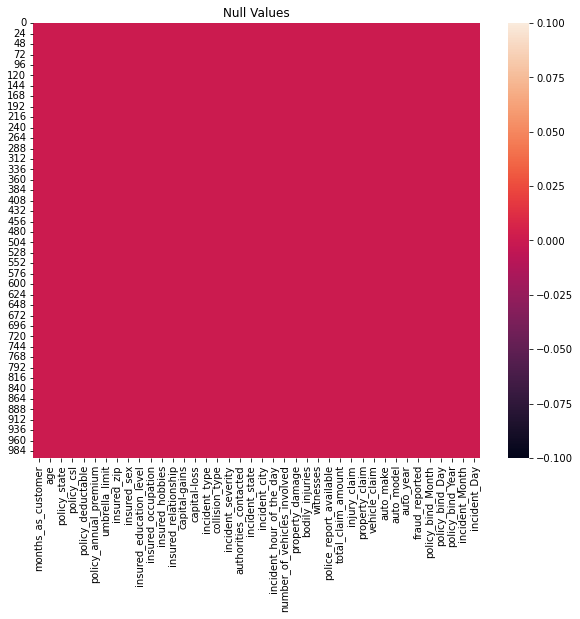

In [64]:
# heatmap on null values
plt.figure(figsize=[10,8])
sns.heatmap(df.isnull())
plt.title("Null Values")
plt.show()

# There are no null values present in the dataset and white spaces in the dataset and  also zero duplicates are present in the datset

In [65]:
#Checking description of data set
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,policy_bind_Month,policy_bind_Day,policy_bind_Year,incident_Month,incident_Day
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000
mean,203.954000,38.948000,1136.000000,1256.406150,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,6.559000,15.448000,2001.604000,3.407000,13.08400
std,115.113174,9.140287,611.864673,244.167395,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,3.391758,8.850176,7.360391,3.276291,10.44318
min,0.000000,19.000000,500.000000,433.330000,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000,1.000000,1.000000,1990.000000,1.000000,1.00000
25%,115.750000,32.000000,500.000000,1089.607500,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,4.000000,8.000000,1995.000000,1.000000,2.00000
50%,199.500000,38.000000,1000.000000,1257.200000,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,7.000000,16.000000,2002.000000,2.000000,15.00000
75%,276.250000,44.000000,2000.000000,1415.695000,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,9.000000,23.000000,2008.000000,5.000000,22.00000
max,479.000000,64.000000,2000.000000,2047.590000,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,12.000000,31.000000,2015.000000,12.000000,31.00000


# Univariate Analysis

In [10]:
#Finding categorical value columns
cat_col=[column for column in df.columns if df[column].dtype=='object']
cat_col

['policy_state',
 'policy_csl',
 'umbrella_limit',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'property_damage',
 'police_report_available',
 'auto_make',
 'auto_model',
 'fraud_reported']

In [9]:
#finding the continous value columns
con_col=[cont_col for cont_col in df.columns if df[cont_col].dtype!='object']
con_col

['months_as_customer',
 'age',
 'policy_number',
 'policy_deductable',
 'policy_annual_premium',
 'insured_zip',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'auto_year',
 'policy_bind_Month',
 'policy_bind_Day',
 'policy_bind_Year',
 'incident_Month',
 'incident_Day']

In [68]:
#Distribution plot for all numerical columns
plt.figure(figsize = (8, 4))

def dis_plot(i):
    sns.distplot(df[con_col[i]], bins = 25, color="g")
    plt.title(con_col[i])
    plt.show()

<Figure size 576x288 with 0 Axes>

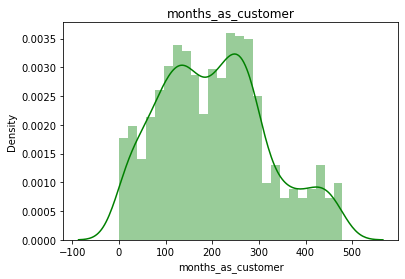

In [69]:
dis_plot(0)

In [ ]:
#normal distrinution of the dataset is being observed


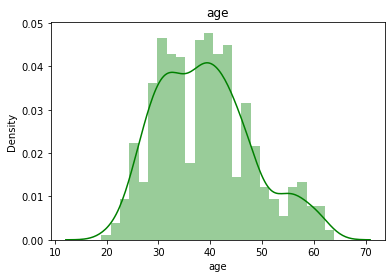

In [70]:
dis_plot(1)

In [ ]:
#normal distrinution of the dataset is being observed


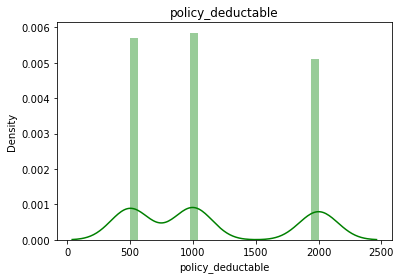

In [71]:
dis_plot(2)

In [ ]:
#The data looks  skewed.The building block is out of the normalised curve.

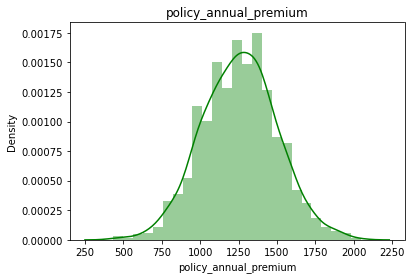

In [72]:
dis_plot(3)

In [ ]:
#normal distrinution of the dataset is being observed


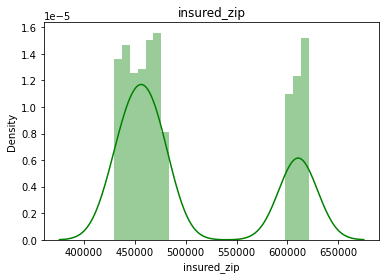

In [73]:
dis_plot(4)

In [ ]:
#The data looks skewed.The building block is out of the normalised curve.

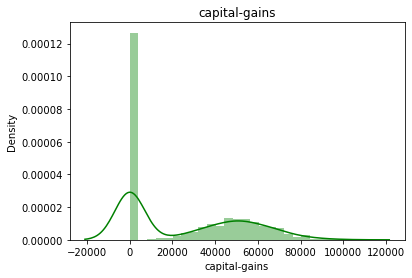

In [74]:
dis_plot(5)

In [ ]:
#The data looks  skewed.The building block is out of the normalised curve.

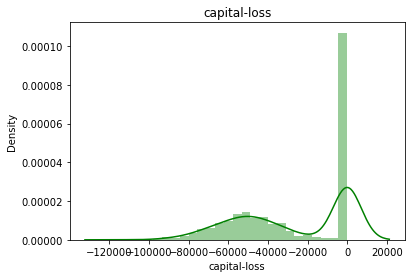

In [75]:
dis_plot(6)

In [ ]:
#normal distrinution of the dataset is being observed


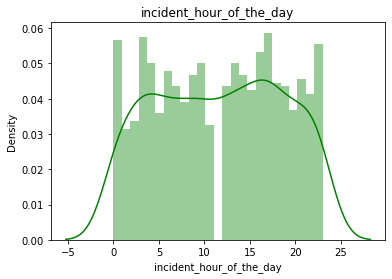

In [76]:
dis_plot(7)

In [ ]:
#normal distrinution of the dataset is being observed


In [77]:
len(con_col)

21

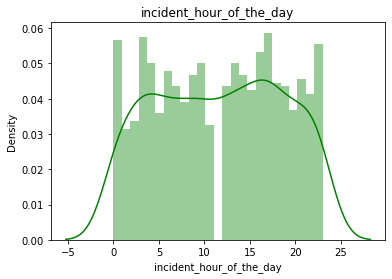

In [78]:
dis_plot(7)

In [ ]:
#normal distrinution of the dataset is being observed


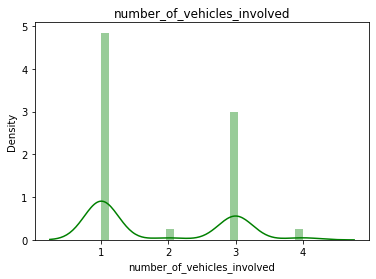

In [79]:
dis_plot(8)

In [ ]:
#The data looks  skewed.The building block is out of the normalised curve. it is a categorical data

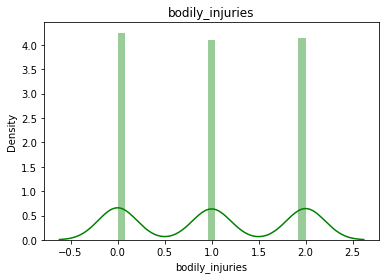

In [80]:
dis_plot(9)

In [ ]:
#The data looks  skewed.The building block is out of the normalised curve. it is a categorical data

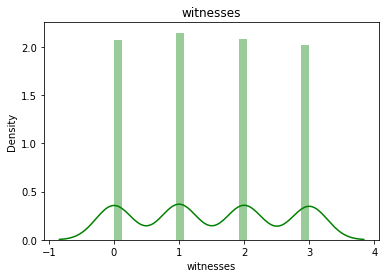

In [81]:
dis_plot(10)

In [ ]:
#The data looks  skewed.The building block is out of the normalised curve. it is a categorical data

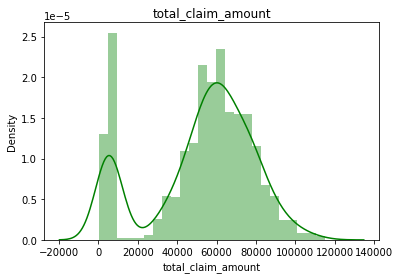

In [82]:
dis_plot(11)

In [ ]:
#The data looks  skewed.The building block is out of the normalised curve.

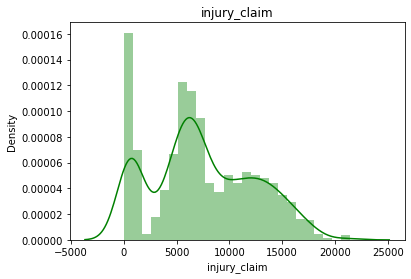

In [83]:
dis_plot(12)

In [ ]:
#normal distrinution of the dataset is being observed


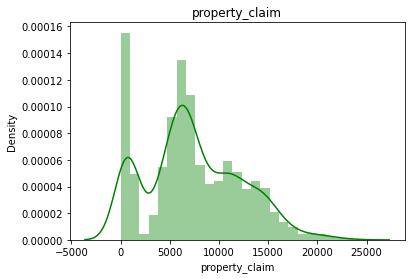

In [84]:
dis_plot(13)

In [ ]:
#normal distrinution of the dataset is being observed


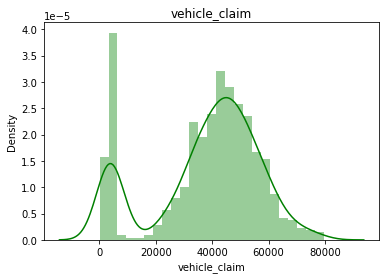

In [85]:
dis_plot(14)

In [ ]:
#The data looks  skewed.The building block is out of the normalised curve.

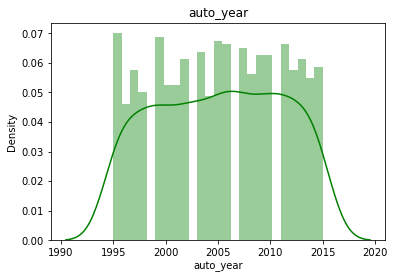

In [86]:
dis_plot(15)

In [ ]:
#normal distrinution of the dataset is being observed


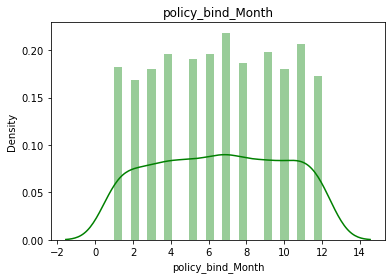

In [87]:
dis_plot(16)

In [ ]:
#normal distrinution of the dataset is being observed


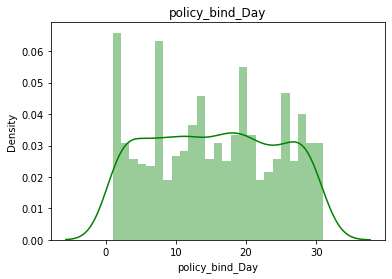

In [88]:
dis_plot(17)

In [ ]:
#normal distrinution of the dataset is being observed
 

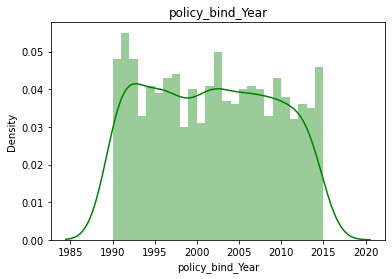

In [89]:
dis_plot(18)

In [ ]:
#normal distrinution of the dataset is being observed
 

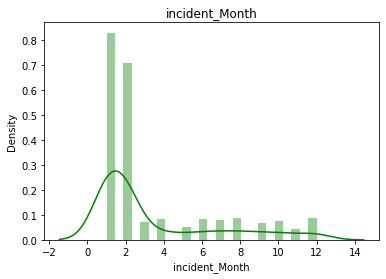

In [90]:
dis_plot(19)

In [ ]:
#The data looks right skewed.The building block is out of the normalised curve.

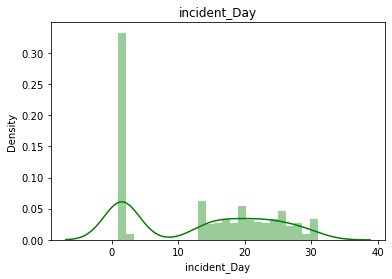

In [91]:
dis_plot(20)

In [ ]:
#The data looks  skewed.The building block is out of the normalised curve.

In [92]:
len(cat_col)

19

In [11]:
def count_plot(i):
    plt.figure(figsize = (12, 4))
    sns.countplot(df[cat_col[i]])
    plt.title(cat_col[i])
    plt.xticks(rotation=90)
    plt.show()

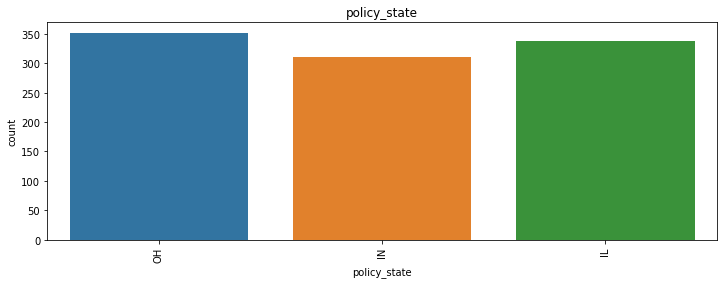

In [94]:
count_plot(0)

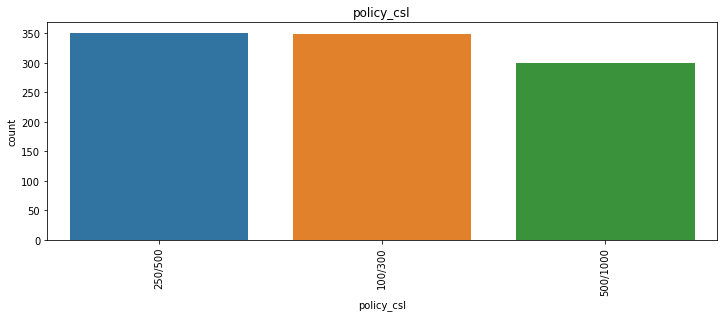

In [95]:
count_plot(1)

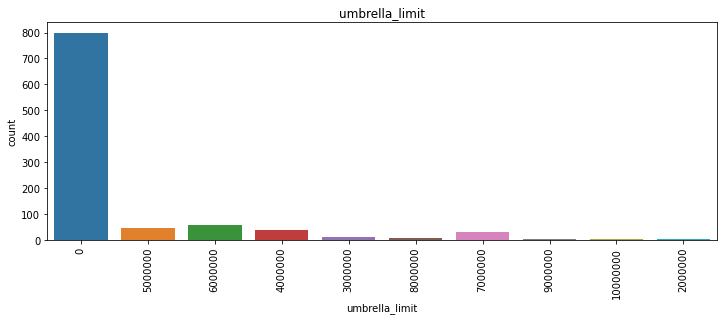

In [14]:
count_plot(2)

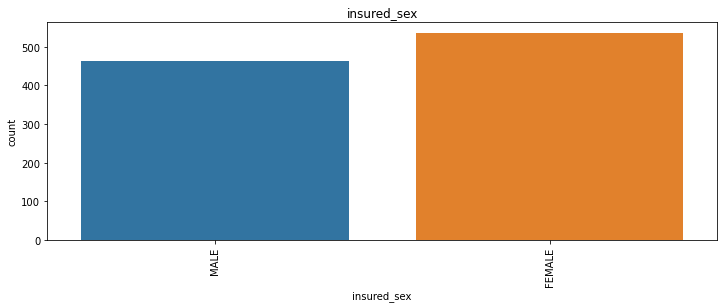

In [97]:
count_plot(3)

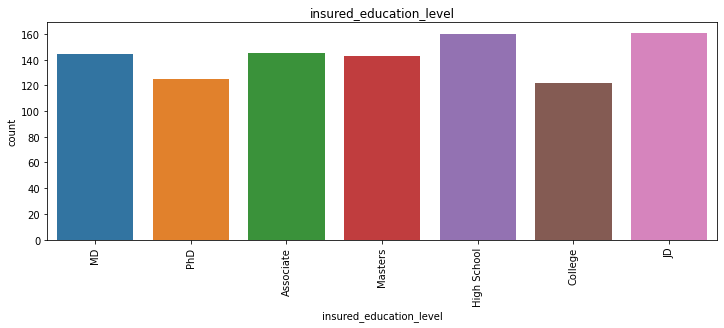

In [98]:
count_plot(4)

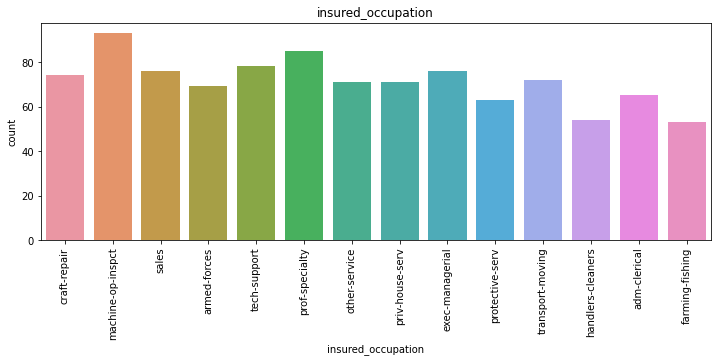

In [99]:
count_plot(5)

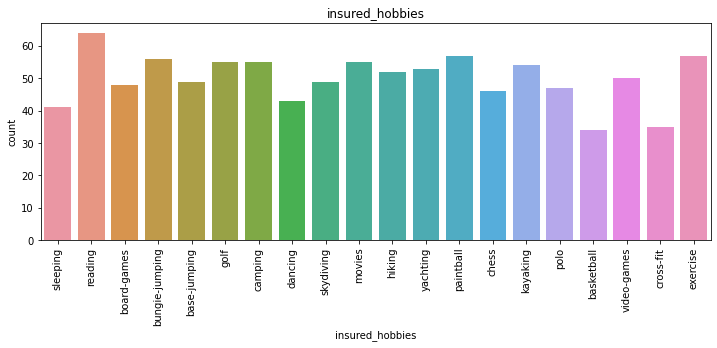

In [100]:
count_plot(6)

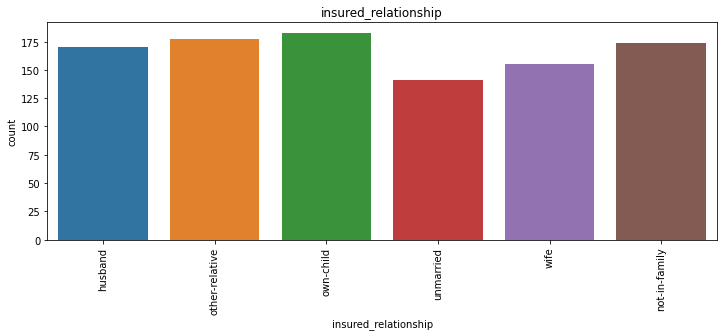

In [101]:
count_plot(7)

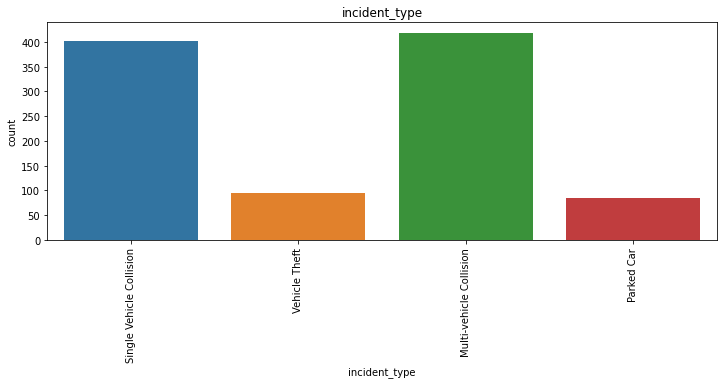

In [102]:
count_plot(8)

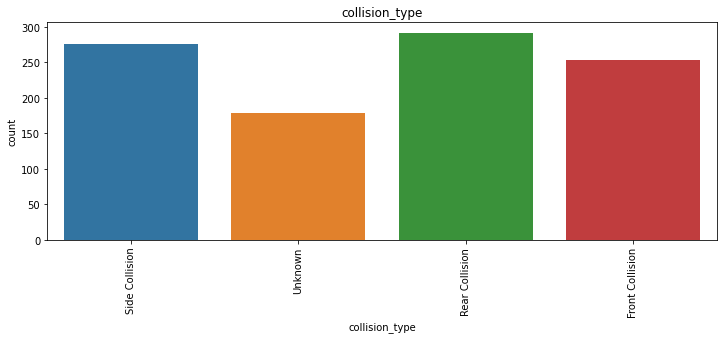

In [103]:
count_plot(9)

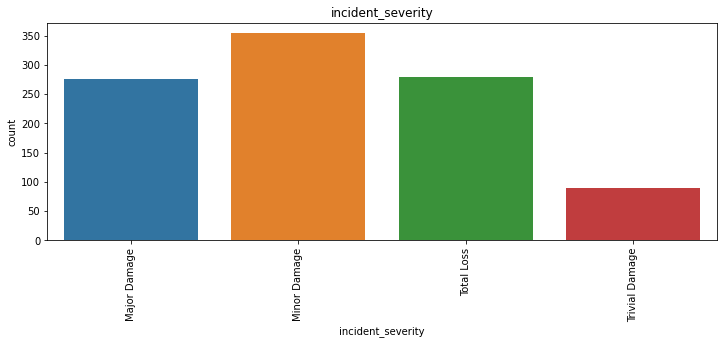

In [104]:
count_plot(10)

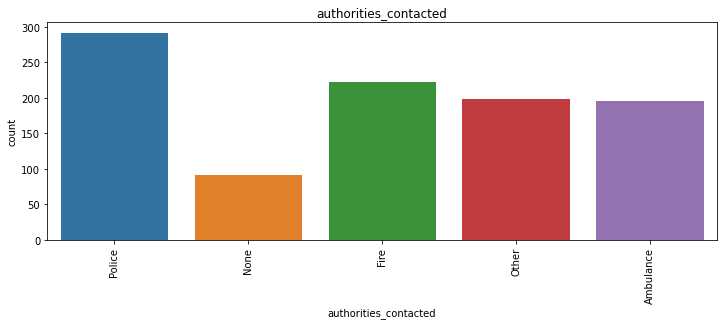

In [105]:
count_plot(11)

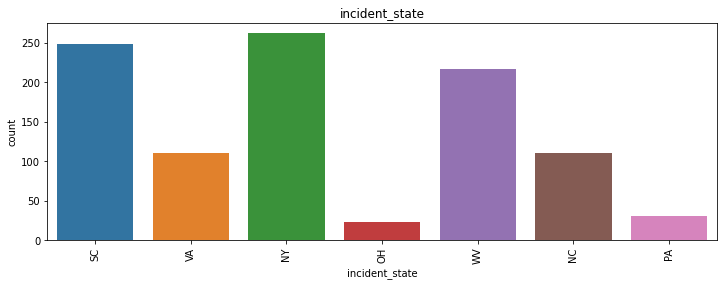

In [106]:
count_plot(12)

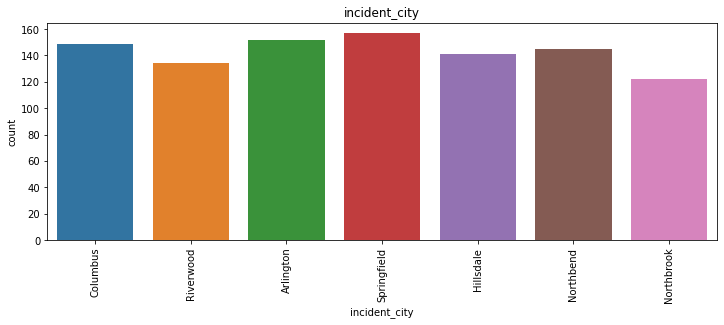

In [107]:
count_plot(13)

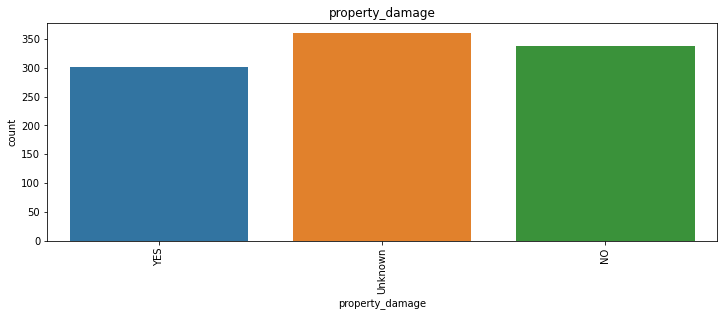

In [108]:
count_plot(14)

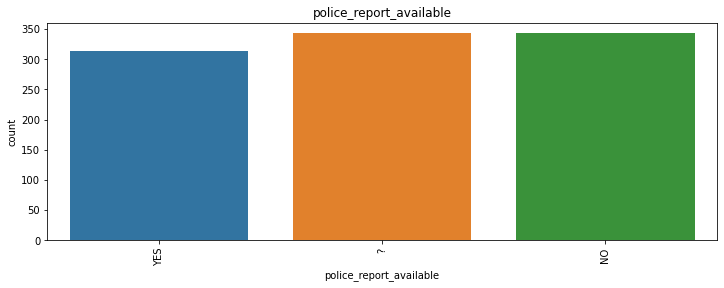

In [15]:
count_plot(15)

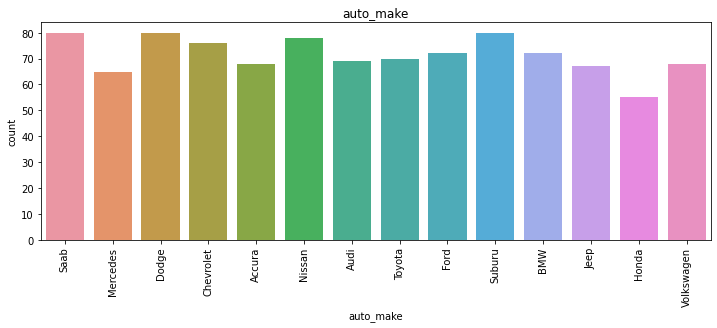

In [110]:
count_plot(16)

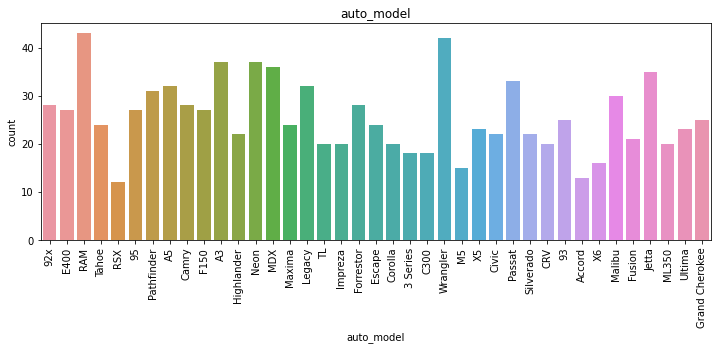

In [111]:
count_plot(17)

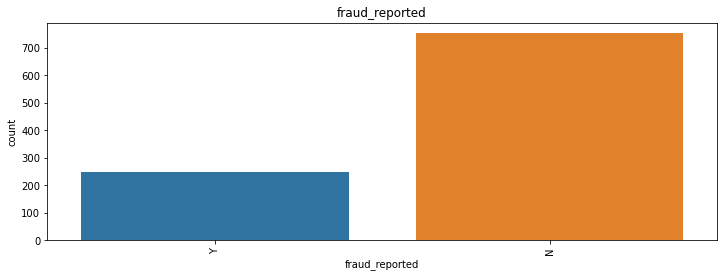

In [112]:
count_plot(18)

# Bivariate Analysis

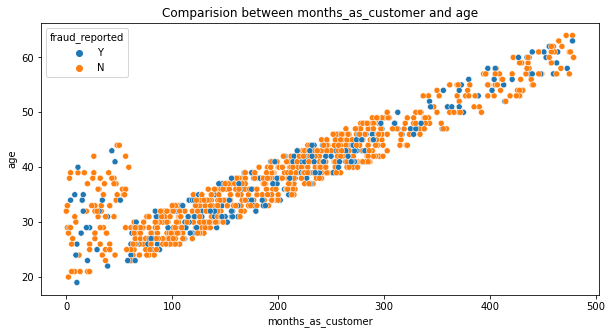

In [113]:
plt.figure(figsize=[10,5])
plt.title('Comparision between months_as_customer and age')
sns.scatterplot(df['months_as_customer'],df['age'],hue=df['fraud_reported']);

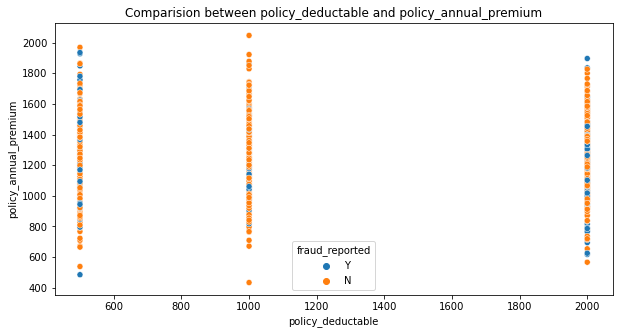

In [114]:
plt.figure(figsize=[10,5])
plt.title('Comparision between policy_deductable and policy_annual_premium')
sns.scatterplot(df['policy_deductable'],df['policy_annual_premium'],hue=df['fraud_reported']);

In [ ]:

We cannot find any major pattern here ,the data is available in 3 values and major data is fraud not reported here

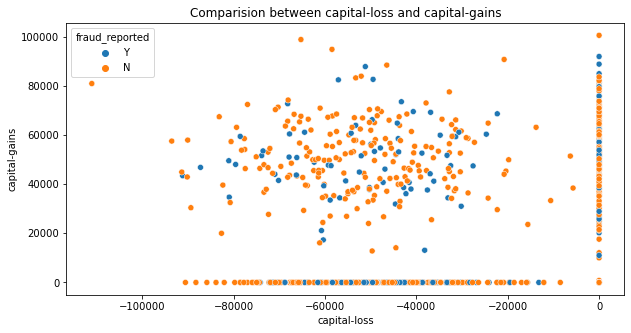

In [115]:
plt.figure(figsize=[10,5])
plt.title('Comparision between capital-loss and capital-gains')
sns.scatterplot(df['capital-loss'],df['capital-gains'],hue=df['fraud_reported']);

We can see higher data cluster in the range of 80000 to 20000 in the the garaph

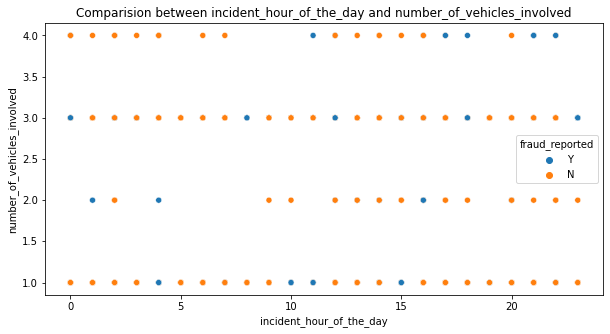

In [116]:
plt.figure(figsize=[10,5])
plt.title('Comparision between incident_hour_of_the_day and number_of_vehicles_involved')
sns.scatterplot(df['incident_hour_of_the_day'],df['number_of_vehicles_involved'],hue=df['fraud_reported']);

Incident hours has no specific relation with number of vehicles invovled.they are scattered

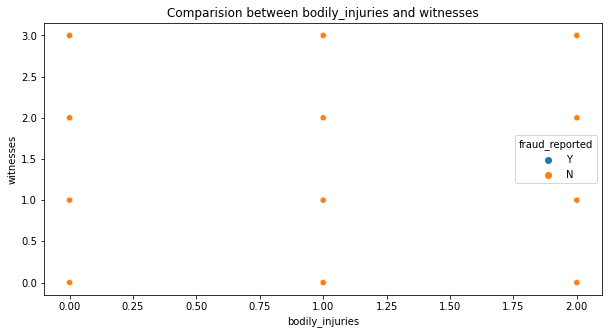

In [117]:
plt.figure(figsize=[10,5])
plt.title('Comparision between bodily_injuries and witnesses')
sns.scatterplot(df['bodily_injuries'],df['witnesses'],hue=df['fraud_reported']);

bodily_injuries has no specific relation with number of witnesses .they are scattered

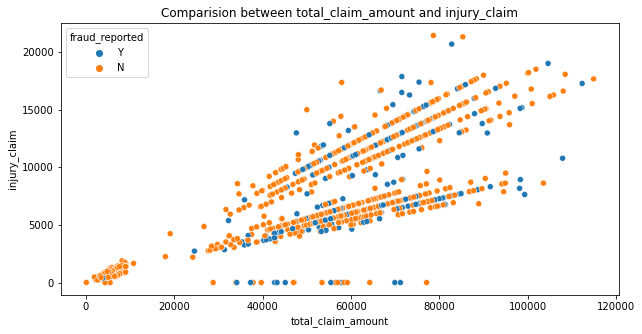

In [118]:
plt.figure(figsize=[10,5])
plt.title('Comparision between total_claim_amount and injury_claim')
sns.scatterplot(df['total_claim_amount'],df['injury_claim'],hue=df['fraud_reported']);

it is showing linear relationship, as one feature increses then other feature also increses.The major data is clustered in between
25000 to 100000

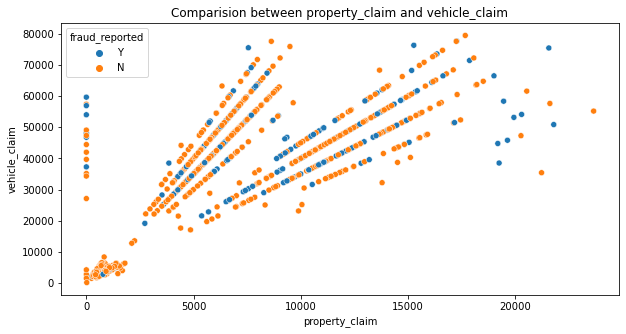

In [119]:
plt.figure(figsize=[10,5])
plt.title('Comparision between property_claim and vehicle_claim')
sns.scatterplot(df['property_claim'],df['vehicle_claim'],hue=df['fraud_reported']);

it is showing linear relationship, as one feature increses then other feature also increses.The major data is clustered in between 0 to 18000

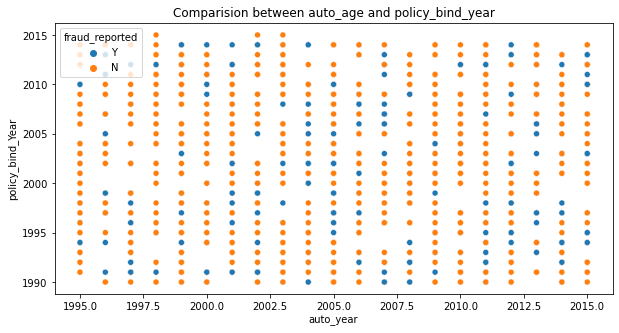

In [120]:
plt.figure(figsize=[10,5])
plt.title('Comparision between auto_age and policy_bind_year')
sns.scatterplot(df['auto_year'],df['policy_bind_Year'],hue=df['fraud_reported']);

the data is scattered in the entire range in each year

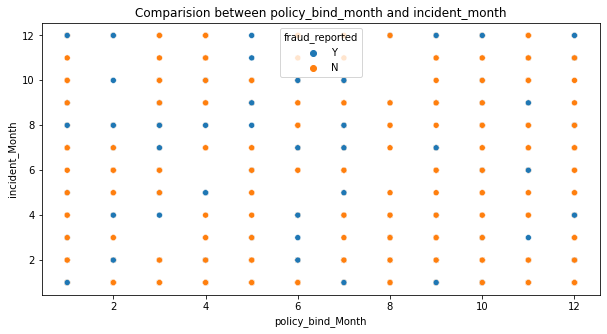

In [121]:
plt.figure(figsize=[10,5])
plt.title('Comparision between policy_bind_month and incident_month')
sns.scatterplot(df['policy_bind_Month'],df['incident_Month'],hue=df['fraud_reported']);

the data is scattered in the entire range in each months

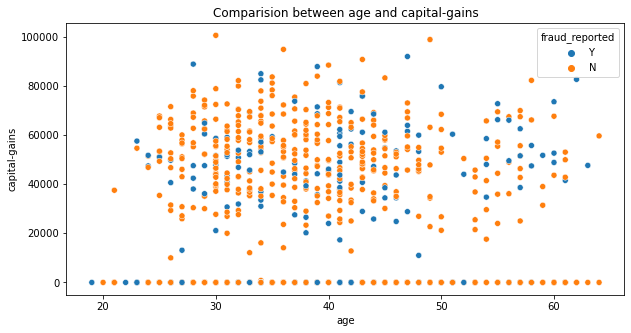

In [122]:
plt.figure(figsize=[10,5])
plt.title('Comparision between age and capital-gains')
sns.scatterplot(df['age'],df['capital-gains'],hue=df['fraud_reported']);


the data is scattered in the entire range and high capital-gains is showing in the age range of 30 to 50

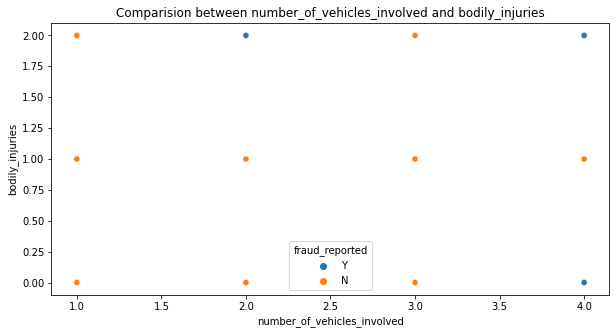

In [123]:
plt.figure(figsize=[10,5])
plt.title('Comparision between number_of_vehicles_involved and bodily_injuries')
sns.scatterplot(df['number_of_vehicles_involved'],df['bodily_injuries'],hue=df['fraud_reported']);

the data is scattered in the entire range in the dataset

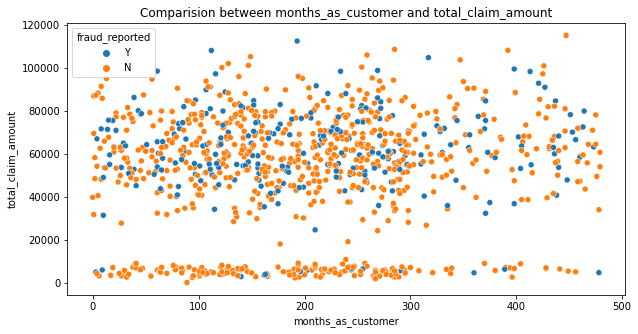

In [124]:
plt.figure(figsize=[10,5])
plt.title('Comparision between months_as_customer and total_claim_amount')
sns.scatterplot(df['months_as_customer'],df['total_claim_amount'],hue=df['fraud_reported']);


In the plot the data is dense near 0 claim amount and for the range of 50-300 in month_as_customer the total_claim_amount is high.

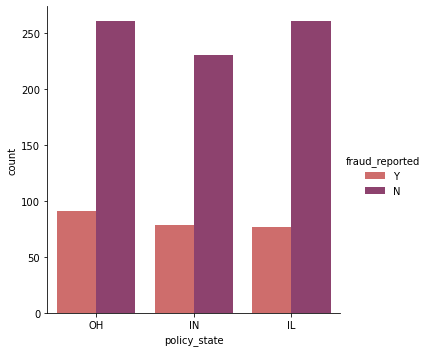

In [125]:
#Factor plot for policy_state
sns.factorplot('policy_state',kind='count',data=df,hue='fraud_reported',palette="flare");


In all the policy state fraud_reported is very less.And mjor fraud not reported is OH and least in the state IN

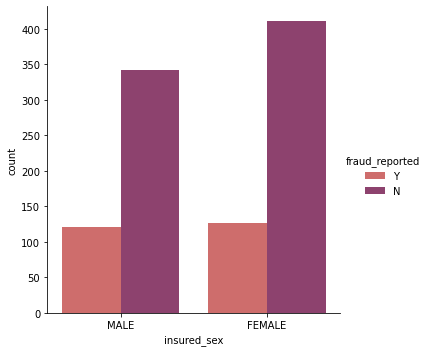

In [16]:
#Factor plot for insured_sex
sns.factorplot('insured_sex',kind='count',data=df,hue='fraud_reported',palette="flare");

Fraud detection is less in both variables but fraud not reported is high for females and less fraud dtected in Males

<Figure size 720x360 with 0 Axes>

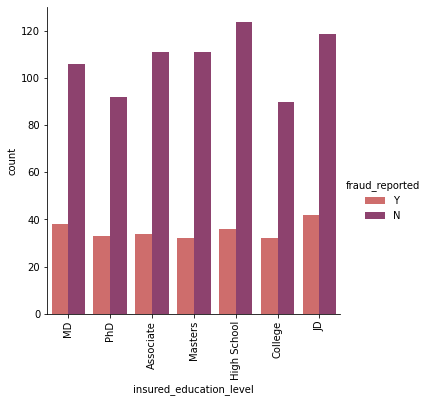

In [128]:
#Factor plot for insured_education_level
plt.figure(figsize=[10,5])
sns.factorplot('insured_education_level',kind='count',data=df,hue='fraud_reported',palette="flare");
plt.xticks(rotation=90);

No fraud is high with customers having highschool education and least in college level.And we can see major fraud detected is in Jd level

<Figure size 720x360 with 0 Axes>

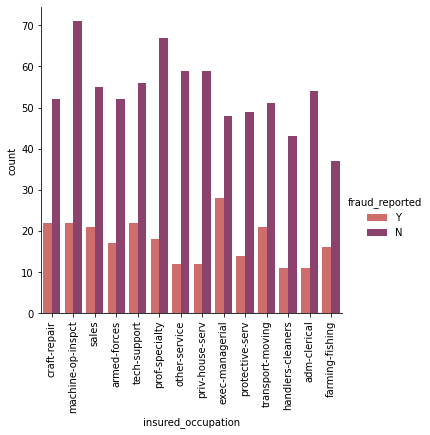

In [130]:
#Factor plot for insured_occupation
plt.figure(figsize=[10,5])
sns.factorplot('insured_occupation',kind='count',data=df,hue='fraud_reported',palette="flare");
plt.xticks(rotation=90);

<Figure size 720x360 with 0 Axes>

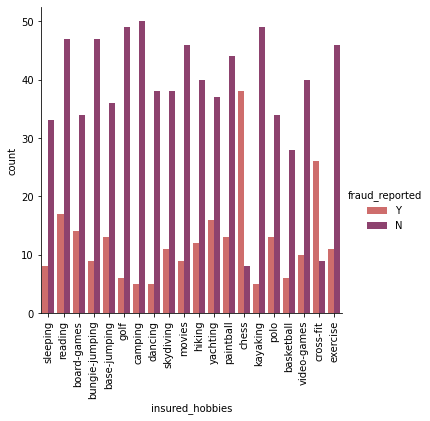

In [132]:
#Factor plot for insured_hobbies
plt.figure(figsize=[10,5])
sns.factorplot('insured_hobbies',kind='count',data=df,hue='fraud_reported',palette="flare");
plt.xticks(rotation=90);

In [133]:
#the highest fraud not reported is in camping and least in chess in the datset
#the highest fraud reported is in chess and least in camping,dancing and kayaking

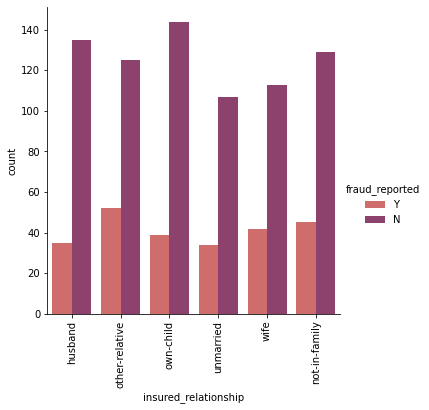

In [134]:
#Factor plot for insured_relationship
sns.factorplot('insured_relationship',kind='count',data=df,hue='fraud_reported',palette="flare");
plt.xticks(rotation=90);

In [135]:
#In unmarried customers the fraud reported is very less.And max in Other relatives
#in Own-child variable we can see highest count in Fraud not reported and least in Unmarried

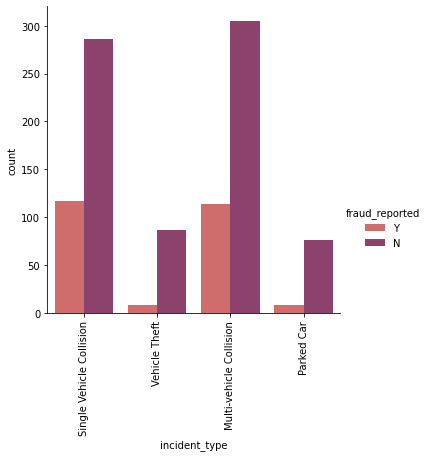

In [136]:
#Factor plot for incident_type
sns.factorplot('incident_type',kind='count',data=df,hue='fraud_reported',palette="flare");
plt.xticks(rotation=90);

In [137]:

#In multi vehicle collision the fraud reported no is very high.And min in parked car
#in multi vehicle collisio variable we can see highest count in fraud reported yes and  least in vehicle theft and parking car

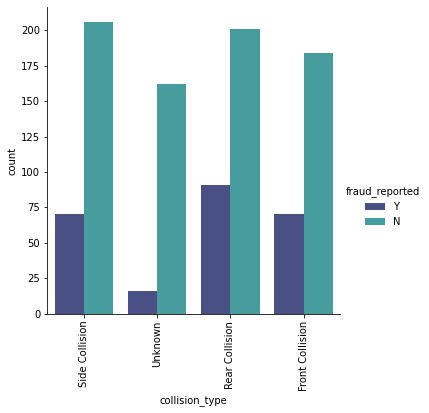

In [138]:
#Factor plot for collision_type
sns.factorplot('collision_type',kind='count',data=df,hue='fraud_reported',palette="mako");
plt.xticks(rotation=90);

In [139]:
#In side collision the fraud detection is more ,least in Unknown variable
#In Rear collision the fraud detection no is more ,least in Unknown variable

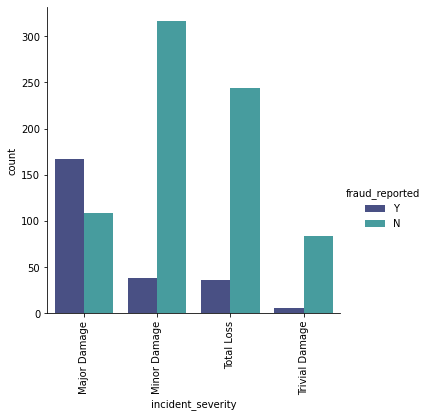

In [140]:
#Factor plot for incident_severity
sns.factorplot('incident_severity',kind='count',data=df,hue='fraud_reported',palette="mako");
plt.xticks(rotation=90);

In [141]:
#In major damage the fraud detection is more ,least in trivial Damage
#In minor collision the fraud detection no is more ,least in trivial Damage

<Figure size 720x360 with 0 Axes>

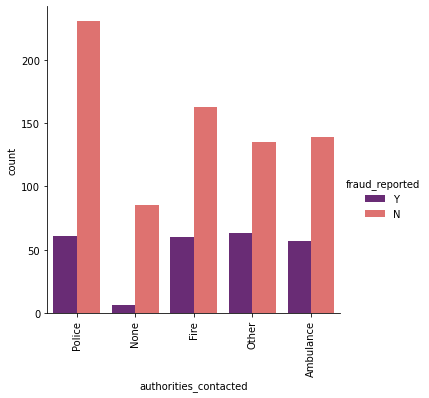

In [142]:
#Factor plot for authorities_contacted
plt.figure(figsize=[10,5])
sns.factorplot('authorities_contacted',kind='count',data=df,hue='fraud_reported',palette="magma");
plt.xticks(rotation=90);

#Police contacted cases are high and fraud reported is almost same in all contacts except None in teh dataset.The least fraud reported No is also in None

<Figure size 720x360 with 0 Axes>

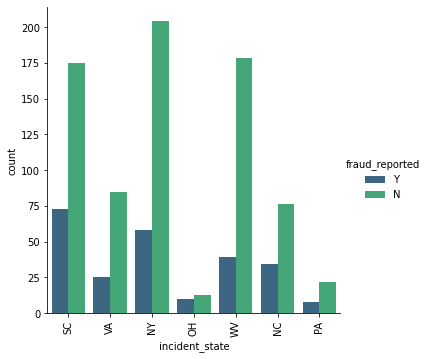

In [144]:
#Factor plot for incident_state
plt.figure(figsize=[10,5])
sns.factorplot('incident_state',kind='count',data=df,hue='fraud_reported',palette="viridis");
plt.xticks(rotation=90);

In [145]:

#In SC the fraud detection is more ,least in PA
#In NY the fraud detection no is more ,least in OH

<Figure size 720x360 with 0 Axes>

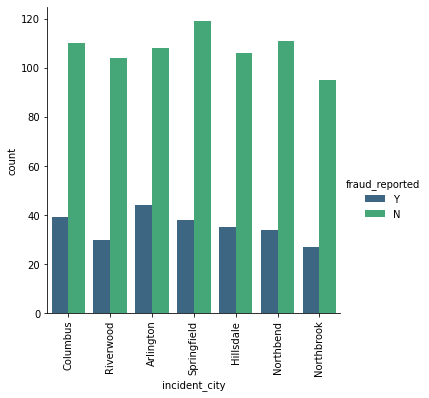

In [146]:
#Factor plot for incident_city
plt.figure(figsize=[10,5])
sns.factorplot('incident_city',kind='count',data=df,hue='fraud_reported',palette="viridis");
plt.xticks(rotation=90);

In [147]:

#In Springfield the fraud detection no is more ,least in Northbrook
#In Arlington the fraud detection  is more ,least in Northbrook

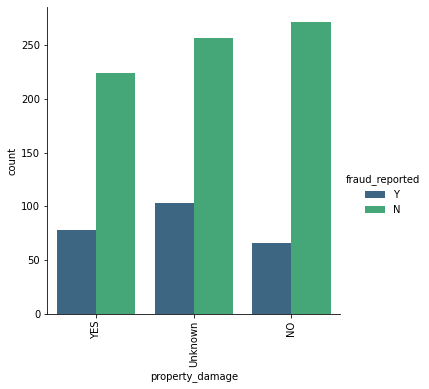

In [148]:
#Factor plot for property_damage
sns.factorplot('property_damage',kind='count',data=df,hue='fraud_reported',palette="viridis");
plt.xticks(rotation=90);

In [149]:

#In No the fraud detection no is more ,least in Yes
#In Unknown the fraud detection  is more ,least in No

In [21]:
df.police_report_available=df.police_report_available.replace('?','Unknown')

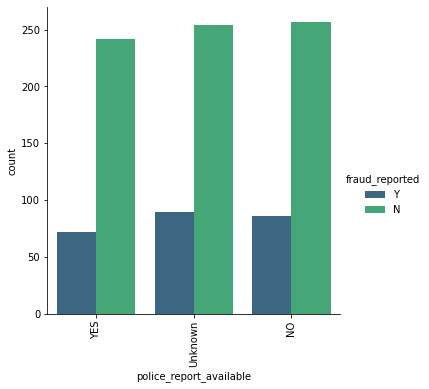

In [22]:
#Factor plot for police_report_available
sns.factorplot('police_report_available',kind='count',data=df,hue='fraud_reported',palette="viridis");
plt.xticks(rotation=90);

In [151]:

#In No the fraud report no is more ,least in Yes
#In Unknown the fraud detection  is more ,least in yes

<Figure size 720x360 with 0 Axes>

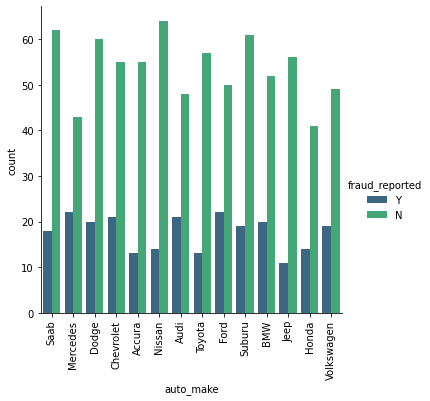

In [152]:
#Factor plot for auto_make
plt.figure(figsize=[10,5])
sns.factorplot('auto_make',kind='count',data=df,hue='fraud_reported',palette="viridis");
plt.xticks(rotation=90);

In [ ]:

#In Nissan the fraud report no is more ,least in Honda
#In Mercedes the fraud detection  is more ,least in jeep

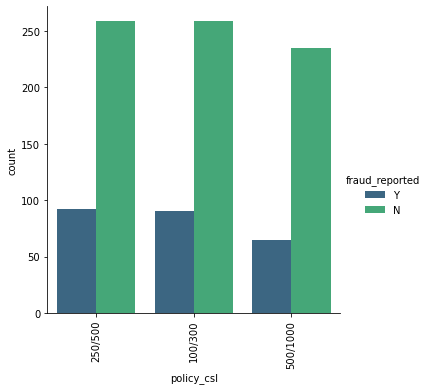

In [153]:
#Factor plot for csl_per_person
sns.factorplot('policy_csl',kind='count',data=df,hue='fraud_reported',palette="viridis");
plt.xticks(rotation=90);

In [ ]:

#In 250/500 and 100/300 the fraud report no is more ,least in 500/1000
#In 250/500 and 100/300 the fraud detection  is more ,least in 500/1000

# Multivariate Analysis

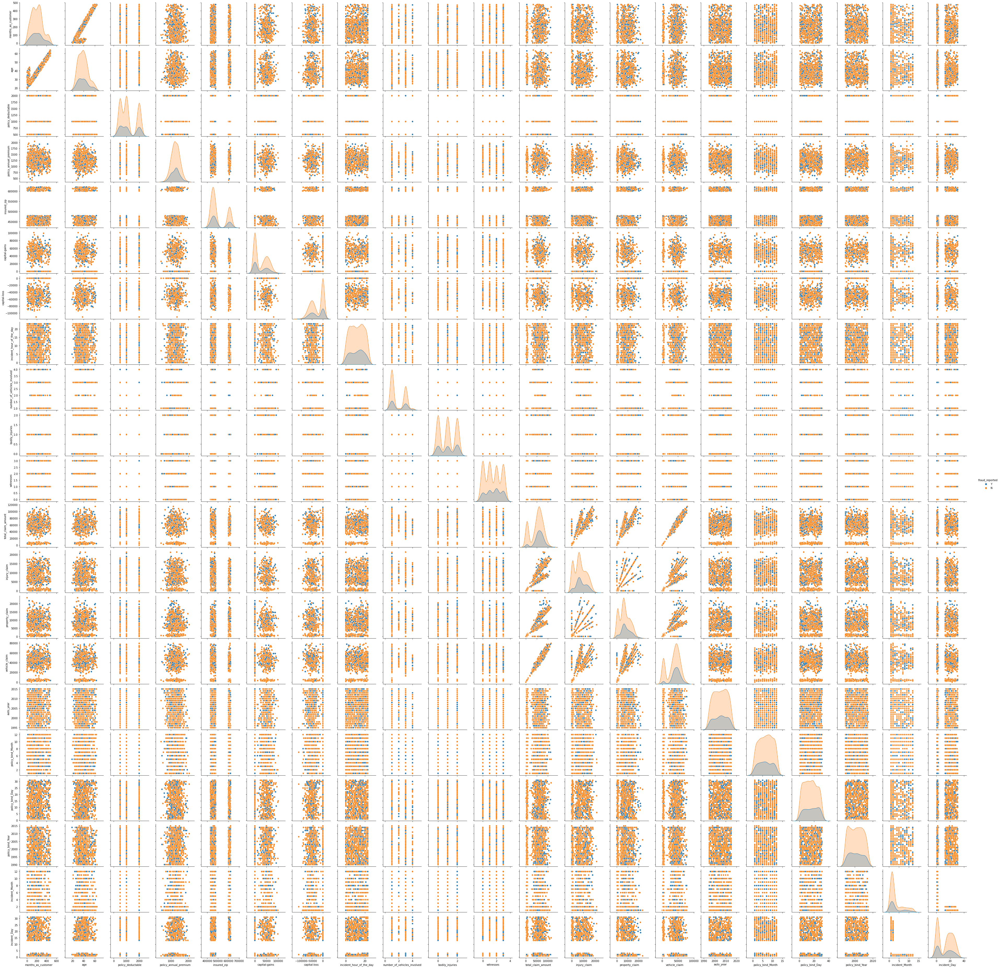

In [154]:
#pair ploting for df
sns.pairplot(df,hue="fraud_reported")

Above is the pair plot for having fraud_reported as target.There are some outliers present in the dataset

# Encoding 

In [20]:
#importing LabelEncoder
from sklearn.preprocessing import LabelEncoder
LE=LabelEncoder()
#applying encoding in categorical datas
df[cat_col]= df[cat_col].apply(LE.fit_transform)

In [21]:
df.head(50)

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_Month,policy_bind_Day,policy_bind_Year,incident_Month,incident_Day
0,328,48,521585,2,1,1000,1406.91,1,-5.551115e-16,1,...,0.753697,10,1,2004,1,10,17,2014,-1.100457,25
1,228,42,342868,1,1,2000,1197.22,5,-4.996004e-16,1,...,-1.786629,8,12,2007,1,6,27,2006,-1.100457,21
2,134,29,687698,2,0,2000,1413.14,5,-1.720846e-15,0,...,-0.820881,4,30,2007,0,6,9,2000,-0.025412,22
3,256,41,227811,0,1,2000,1415.74,6,2.164935e-15,0,...,0.677602,3,34,2014,1,5,25,1990,1.553521,1
4,228,44,367455,0,2,1000,1583.91,6,2.164935e-15,1,...,-1.740038,0,31,2009,0,6,6,2014,-0.025412,17
5,256,39,104594,2,1,1000,1351.10,1,-2.220446e-16,0,...,0.708914,10,3,2003,1,12,10,2006,-0.025412,1
6,137,34,413978,1,1,1000,1333.35,1,-1.276756e-15,1,...,0.640180,9,29,2012,0,4,6,2000,-1.100457,13
7,165,37,429027,0,0,1000,1137.03,1,2.053913e-15,1,...,-0.304831,1,5,2015,0,3,2,1990,-0.025412,27
8,27,33,485665,0,0,500,1442.99,1,2.053913e-15,0,...,-0.869843,12,9,2012,0,5,2,1997,-1.100457,30
9,212,42,636550,0,0,500,1315.68,1,2.053913e-15,1,...,-0.301064,10,1,1996,0,7,25,2011,1.057132,1


# Checking for outliers

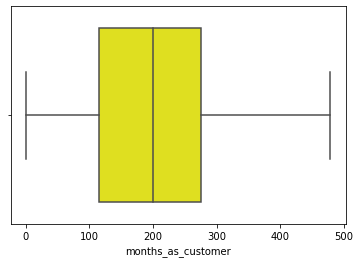

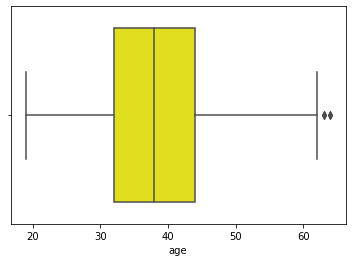

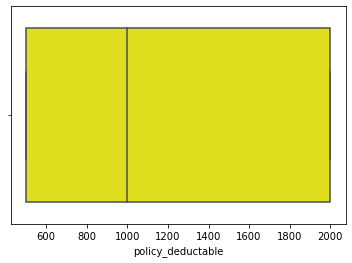

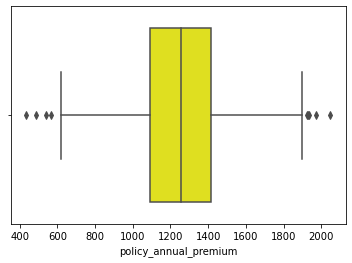

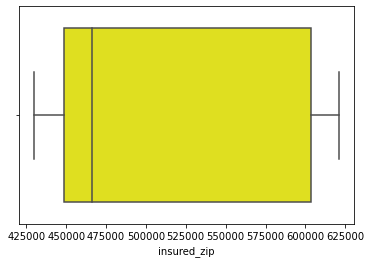

...

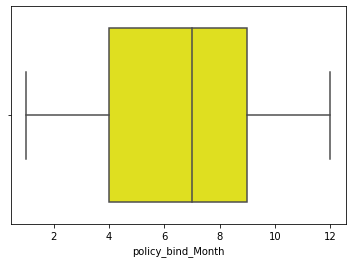

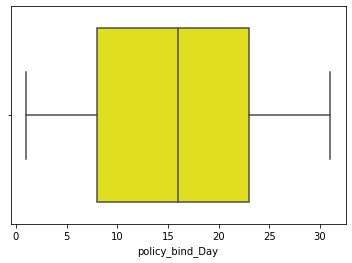

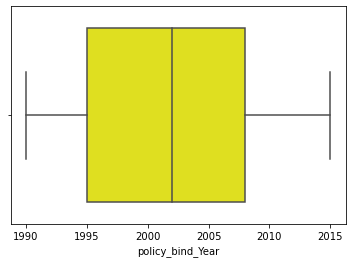

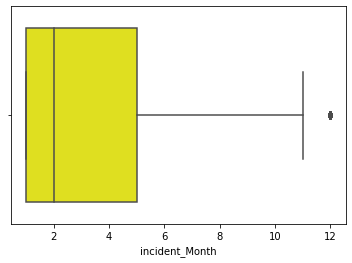

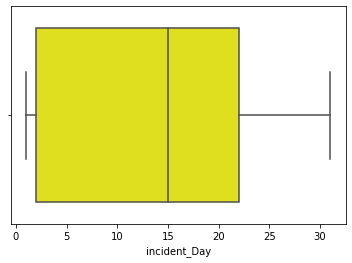

In [157]:
def bxplt(a):
    plt.figure()
    sns.boxplot(df[con_col[a]],data=df,color='yellow')
    
for i in range(0,21):
    bxplt(i)

In [23]:
#Features having outliers
#we can see outliers in the columns 'age','policy_annual_premium','total_claim_amount','property_claim','incident_month' .
#but theset Features cannot consider as outliers since these values can  take place in the insurance claim in the dataset as allowable so,
#We ill consider the entire dataset as it is good quality data

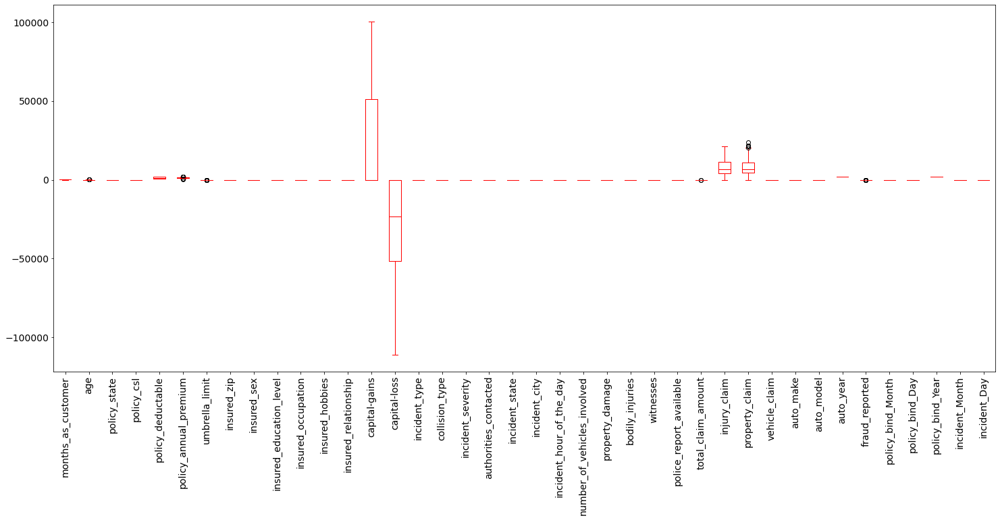

In [163]:
#Checking for outliers using boxplot
df.plot(rot = 90,kind='box',fontsize=14,figsize=(25,10),color='r');

# Skewness Removal

In [22]:
#initialising x and y
X=df.drop(['fraud_reported'],axis=1)
y=df.fraud_reported

In [24]:
X.skew().sort_values()

vehicle_claim                 -0.522718
total_claim_amount            -0.510354
capital-loss                  -0.391472
incident_state                -0.148865
authorities_contacted         -0.121744
auto_model                    -0.080773
insured_hobbies               -0.061563
insured_occupation            -0.058881
auto_year                     -0.048289
incident_hour_of_the_day      -0.035584
policy_bind_Month             -0.029321
policy_state                  -0.026177
auto_make                     -0.018797
insured_education_level       -0.000148
insured_zip                    0.000000
policy_annual_premium          0.004402
bodily_injuries                0.014777
witnesses                      0.019636
policy_bind_Day                0.024372
policy_number                  0.038991
incident_city                  0.049531
policy_bind_Year               0.052511
police_report_available        0.052967
incident_Day                   0.059111
property_damage                0.064799


In [25]:
#Creating a list of skewed features
fea=['umbrella_limit','incident_Month','insured_zip' ,'number_of_vehicles_involved','vehicle_claim','total_claim_amount']

In [26]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')


In [27]:
#Applying transformation in list with skewness
X[fea] = scaler.fit_transform(X[fea].values)

In [28]:
#checking the updated skewness
X[fea].skew()

umbrella_limit                -0.370613
incident_Month                 0.092346
insured_zip                    0.667187
number_of_vehicles_involved    0.341953
vehicle_claim                  0.051547
total_claim_amount             0.051580
dtype: float64

In [24]:
#We have removed the skewness in the dataset 

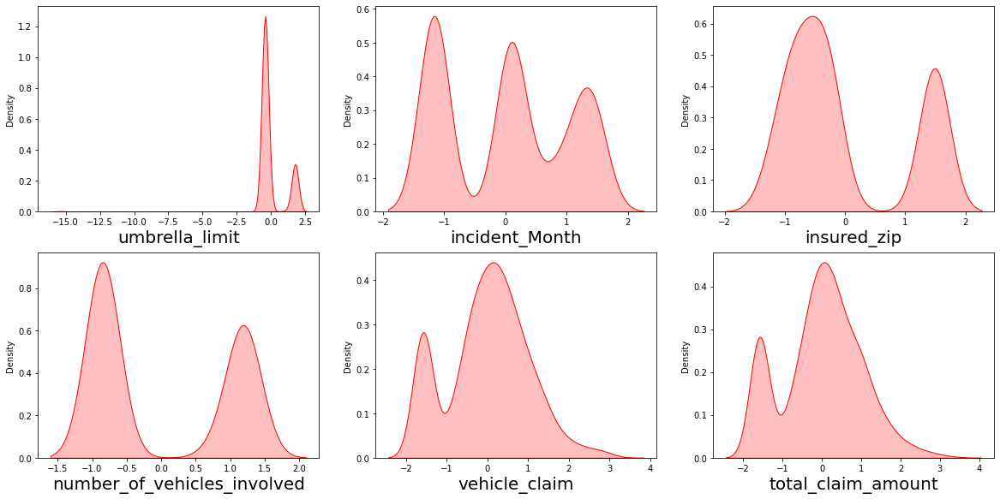

In [172]:
# After removing let's check how the data has been distributed in each column.

plt.figure(figsize=(20,15), facecolor='white')
plotnumber = 1

for column in df[fea]:
    if plotnumber<=9:
        ax = plt.subplot(3,3,plotnumber)
        sns.distplot(df[column],color='r',kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

# Scaling the data

In [30]:
from sklearn.preprocessing import StandardScaler
SC=StandardScaler()
X_scaled=SC.fit_transform(X)

# checking multicollinearity

In [31]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X_scaled,i) for i in range(X.shape[1])]
vif['features']=X.columns
vif

,vif,features
0,6.858936,months_as_customer
1,6.859591,age
2,1.038670,policy_number
3,1.046428,policy_state
4,1.039559,policy_csl
5,1.042993,policy_deductable
6,1.035592,policy_annual_premium
7,1.040828,umbrella_limit
8,1.033954,insured_zip
9,1.030340,insured_sex


In [25]:
#vif score is more than 10% so  multicloolinearity is present in the dataset.Lets drop the columns with highest mulicollinearity found  iteratively.

In [34]:

X.drop('total_claim_amount',axis=1,inplace=True)

In [35]:
X_scaled=SC.fit_transform(X)
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(X_scaled,i) for i in range(X.shape[1])]
vif['features']=X.columns
vif

,vif,features
0,6.857376,months_as_customer
1,6.857868,age
2,1.038497,policy_number
3,1.045593,policy_state
4,1.039220,policy_csl
5,1.039366,policy_deductable
6,1.032014,policy_annual_premium
7,1.040539,umbrella_limit
8,1.029525,insured_zip
9,1.028835,insured_sex


vif score is less than 10% so we can ignore the multicloolinearity in the dataset.

# Applying PCA

In [36]:
from sklearn.decomposition import PCA
pca=PCA()
pca.fit_transform(X_scaled)


array([[ 0.06695398,  1.12849159, -1.79442112, ...,  0.12864547,
         0.07312138, -0.10112783],
       [-3.48303212,  0.72976796, -0.70490111, ...,  0.09869759,
        -0.42123995,  0.31894678],
       [-0.15281082, -1.06291932, -0.19630855, ..., -0.36175633,
        -0.22667207, -0.22841488],
       ...,
       [ 0.18071839, -0.96211664, -1.81562747, ...,  0.54612318,
         0.02739743,  0.21053615],
       [-0.56058666,  3.8729883 , -0.55593229, ..., -0.05754501,
         0.09438395,  0.15665102],
       [-2.7014631 ,  3.08609365, -1.75259744, ..., -0.04177415,
         0.59503319, -0.18428169]])

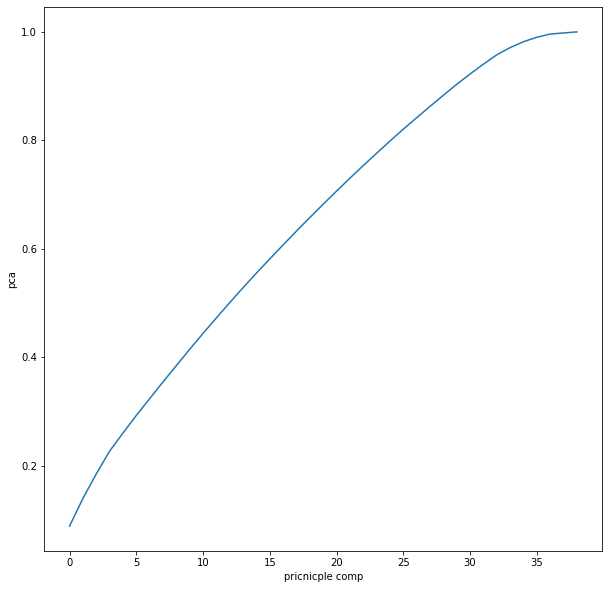

In [37]:
plt.figure(figsize=(10,10))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("pricnicple comp")
plt.ylabel("pca")
plt.show()

In [180]:
len(X.columns)

38

based on the plott 35 features are explaining the data set. So we can go with no. 35 as no.of components here.

In [38]:
pca=PCA(n_components=35)
new_pcomp=pca.fit_transform(X_scaled)
princi_comp=pd.DataFrame(new_pcomp,columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10',
                                            'PC11','PC12','PC13','PC14','PC15','PC16','PC17','PC18','PC19',
                                            'PC20','PC21','P22','PC23','PC24','PC25','PC26','PC27','PC28',
                                            'PC29','PC30','PC31','PC32','PC33','PC34','PC35'])

In [188]:
princi_comp.head(100)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,P22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35
0,0.066786,1.097729,-1.879498,2.071766,1.992903,-0.242265,-0.643652,0.988060,0.961679,0.551471,-0.107908,-0.548564,1.486382,0.880112,1.347626,0.127127,-1.333651,-1.216013,-0.134282,-1.244454,-0.750435,-0.855688,1.129017,-0.608669,-0.967441,-0.204895,0.507549,0.023115,-1.042850,1.630364,0.287316,-0.094698,0.744786,0.710834,0.261474
1,-3.485125,0.764386,-0.857967,0.323370,-0.089685,-0.161234,1.232380,0.561078,-1.050730,-0.290066,-0.135558,0.199957,1.672110,1.079690,-1.266539,-0.179767,1.012139,-0.433007,-0.249075,-2.161234,0.528918,-0.358652,0.815982,-0.079369,-0.965834,-0.504703,-0.477587,1.473350,0.472807,0.528221,0.846444,0.165654,-0.252219,0.092809,0.298048
2,-0.148139,-1.134334,-0.062630,-1.757722,-1.556349,-0.855431,-1.611211,-0.337395,0.937849,-0.145681,-1.912499,0.001874,-1.060783,0.078795,0.735204,0.609287,1.456737,0.171618,1.202064,-1.589267,-1.797648,0.166270,0.790911,-0.435115,-0.044875,-1.380904,-1.025065,-0.355570,-0.443099,-0.542884,-0.578262,1.285963,-0.844549,-0.753545,-0.535391
3,0.458175,1.251368,2.323008,-0.338048,-1.962570,-1.423191,-1.602828,1.821346,0.011852,0.378287,-0.916763,0.790121,0.762194,-0.608314,-0.670577,-0.732097,2.113366,-0.540298,1.741963,0.206583,0.779830,0.301644,-0.011919,-1.445122,-0.575162,1.550209,1.298411,-0.658192,-0.856528,-0.062947,-0.916367,1.144674,-0.875608,0.080117,-0.188132
4,-2.922830,1.204145,-0.061652,-0.434723,-2.821026,0.000887,-0.988335,-1.254638,0.867809,0.304642,0.620841,1.718482,0.016695,-1.550213,-0.133425,1.280270,0.735932,1.301630,-1.700283,-0.964851,0.988628,-1.935807,-0.598742,-0.519132,0.189189,0.928808,2.373381,-0.314631,0.162086,0.518544,0.372595,0.446919,0.787999,-0.019140,-0.516996
5,1.513390,0.433787,0.282059,-0.949772,0.921315,1.026656,-0.083197,-1.354821,0.691219,1.346963,-2.074879,1.352557,-1.578180,0.876177,-0.749342,1.281804,-1.077246,0.385297,0.452504,0.298671,0.120261,-0.435612,0.730846,-1.191901,-0.334419,-1.145973,-0.453819,-0.498866,0.783508,0.834417,0.562351,1.157555,0.074100,-0.246844,0.585205
6,2.136779,-1.332680,-0.602275,-0.188975,-0.917057,-0.761502,0.762587,-0.414390,-1.109469,-1.951307,-1.543206,-0.183082,-0.138370,1.069239,1.820517,-0.299350,1.205416,0.264195,0.717282,0.531692,0.871877,-1.499510,-0.138076,0.509222,-0.723782,2.349214,-2.174991,1.241416,0.028714,0.635217,0.019499,-0.124565,-0.561532,-1.958738,0.665031
7,0.914295,-0.081894,-1.179287,-0.974864,-0.401250,1.806654,-1.936924,-1.213233,-0.957778,-1.576289,-0.483738,-1.704708,-1.106992,0.393104,-0.310531,-0.683747,1.075566,0.457272,-0.076340,0.841434,-1.329340,-0.753964,-1.126321,-1.463030,2.018702,-0.203611,2.108041,-0.953582,0.585839,-1.453775,1.327499,-0.022808,-1.271638,0.246519,-0.910543
8,-1.895540,-1.144164,-1.377302,1.042551,0.603538,0.624595,-0.889407,0.204181,1.084906,-1.111622,-2.519757,-0.938996,-0.543100,1.191993,-1.441656,-0.675963,0.072851,1.713123,-0.221740,1.073314,0.722920,-0.737228,-0.497656,-2.001794,0.689507,-0.620650,1.022081,-1.208520,0.546660,-0.201896,-0.614474,0.574036,-2.119940,0.231946,-0.166369
9,-0.985245,1.200059,1.938438,-0.150857,-0.270218,1.157768,0.536021,-1.365949,1.497118,-0.503066,-1.547892,1.000308,1.583405,-0.370021,-0.532636,-1.499407,-0.784993,-0.346402,-0.384085,0.112822,0.229824,0.098907,-0.282896,-1.145447,2.824072,0.520151,-1.226742,-0.225166,0.824287,1.148652,-0.230660,0.600540,-0.525700,0.295659,0.215133


In [185]:
princi_comp.shape

(1000, 35)

In [39]:
#initialising x and y
X=princi_comp
y=df.fraud_reported

# Balancing  

Balancing the target variable using oversampling

In [191]:
#Checking the value count of target column
y.value_counts()

0    753
1    247
Name: fraud_reported, dtype: int64

In [40]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
X, y = SM.fit_resample(X,y)

In [41]:
#Checking the updated value count of target column
y.value_counts()

1    753
0    753
Name: fraud_reported, dtype: int64

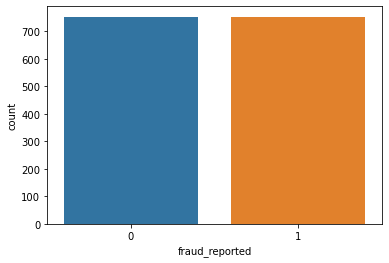

In [195]:
# Visualizing the target data after oversampling
sns.countplot(y);

the target variable is now balanced

# Model Building

In [218]:
#finding best random_state

maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=.30,random_state=i)
    LR=LogisticRegression()
    LR.fit(x_train,y_train)
    predrf=LR.predict(x_test)
    acc=accuracy_score(y_test,predrf)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on random_state ",maxRS)

Best accuracy is  0.7743362831858407  on random_state  142


In [42]:
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=.30,random_state=142)

In [43]:
# different algorithm going to use

lg=LogisticRegression()
knn=KNeighborsClassifier()
sv=SVC()
dtc=DecisionTreeClassifier()
rf=RandomForestClassifier(n_estimators=100)
ada=AdaBoostClassifier(n_estimators=100)
gd=GradientBoostingClassifier()
xgb=XGBClassifier()
etc=ExtraTreesClassifier()

In [44]:
#code for Training and Prediction 

def evaluate(x):
    model=x
    print(model)
    #training the model
    model.fit(x_train,y_train)
    pred_train=model.predict(x_train)
    #model prediction
    pred=model.predict(x_test)
    
    print("train accuracy score is {:.2f}%".format(accuracy_score(y_train,pred_train)*100))
    print("test accuracy score is {:.2f}%".format(accuracy_score(y_test,pred)*100))
    
    print("\n")
    print("Confusion Matrix : \n",confusion_matrix(y_test,pred))
    print("\n")
    print("Classification Report  : \n",classification_report(y_test,pred))

In [223]:
#calling LogisticRegressionClassifier
evaluate(lg)

LogisticRegression()
train accuracy score is 72.77%
test accuracy score is 77.43%


Confusion Matrix : 
 [[181  52]
 [ 50 169]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.78      0.78      0.78       233
           1       0.76      0.77      0.77       219

    accuracy                           0.77       452
   macro avg       0.77      0.77      0.77       452
weighted avg       0.77      0.77      0.77       452



In [224]:
#calling KNeighborsClassifier
evaluate(knn)

KNeighborsClassifier()
train accuracy score is 72.30%
test accuracy score is 66.15%


Confusion Matrix : 
 [[ 89 144]
 [  9 210]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.91      0.38      0.54       233
           1       0.59      0.96      0.73       219

    accuracy                           0.66       452
   macro avg       0.75      0.67      0.64       452
weighted avg       0.76      0.66      0.63       452



In [225]:
#calling SVC Classifier
evaluate(sv)

SVC()
train accuracy score is 96.77%
test accuracy score is 88.94%


Confusion Matrix : 
 [[205  28]
 [ 22 197]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.90      0.88      0.89       233
           1       0.88      0.90      0.89       219

    accuracy                           0.89       452
   macro avg       0.89      0.89      0.89       452
weighted avg       0.89      0.89      0.89       452



In [226]:
#calling DecisionTreeClassifier
evaluate(dtc)

DecisionTreeClassifier()
train accuracy score is 100.00%
test accuracy score is 71.90%


Confusion Matrix : 
 [[161  72]
 [ 55 164]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.75      0.69      0.72       233
           1       0.69      0.75      0.72       219

    accuracy                           0.72       452
   macro avg       0.72      0.72      0.72       452
weighted avg       0.72      0.72      0.72       452



In [227]:
#calling RandomForestClassifier
evaluate(rf)

RandomForestClassifier()
train accuracy score is 100.00%
test accuracy score is 88.27%


Confusion Matrix : 
 [[201  32]
 [ 21 198]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.91      0.86      0.88       233
           1       0.86      0.90      0.88       219

    accuracy                           0.88       452
   macro avg       0.88      0.88      0.88       452
weighted avg       0.88      0.88      0.88       452



In [228]:
#calling AdaBoostClassifier
evaluate(ada)

AdaBoostClassifier(n_estimators=100)
train accuracy score is 88.99%
test accuracy score is 81.19%


Confusion Matrix : 
 [[185  48]
 [ 37 182]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.83      0.79      0.81       233
           1       0.79      0.83      0.81       219

    accuracy                           0.81       452
   macro avg       0.81      0.81      0.81       452
weighted avg       0.81      0.81      0.81       452



In [229]:
#calling GradientBoostingClassifier
evaluate(gd)

GradientBoostingClassifier()
train accuracy score is 97.06%
test accuracy score is 84.07%


Confusion Matrix : 
 [[184  49]
 [ 23 196]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.89      0.79      0.84       233
           1       0.80      0.89      0.84       219

    accuracy                           0.84       452
   macro avg       0.84      0.84      0.84       452
weighted avg       0.85      0.84      0.84       452



In [230]:
#calling XGBClassifier
evaluate(xgb)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, gamma=None,
              gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=None,
              reg_alpha=None, reg_lambda=None, ...)
train accuracy score is 100.00%
test accuracy score is 88.27%


Confusion Matrix : 
 [[193  40]
 [ 13 206]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.94      0.83      0.88       233
           1 

In [231]:
#calling Extra tree Classifier
evaluate(etc)

ExtraTreesClassifier()
train accuracy score is 100.00%
test accuracy score is 93.14%


Confusion Matrix : 
 [[218  15]
 [ 16 203]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.93      0.94      0.93       233
           1       0.93      0.93      0.93       219

    accuracy                           0.93       452
   macro avg       0.93      0.93      0.93       452
weighted avg       0.93      0.93      0.93       452



In [232]:
model=[lg,knn,sv,dtc,rf,ada,gd,xgb,etc]

for m in model:
    score=cross_val_score(m,X,y,cv=5)
    print(m,"Cross val score is ",score*100,"   ")
    print("mean is ",score.mean()*100,"\n\n")



LogisticRegression() Cross val score is  [71.52317881 71.42857143 72.75747508 72.09302326 73.42192691]    
mean is  72.24483509713757 


KNeighborsClassifier() Cross val score is  [63.90728477 63.4551495  67.77408638 69.43521595 68.43853821]    
mean is  66.60205496028689 


SVC() Cross val score is  [82.45033113 83.72093023 89.70099668 89.70099668 89.03654485]    
mean is  86.9219599128732 


DecisionTreeClassifier() Cross val score is  [73.8410596  72.09302326 72.09302326 71.76079734 75.08305648]    
mean is  72.97419198697497 


RandomForestClassifier() Cross val score is  [82.45033113 83.72093023 91.02990033 92.6910299  89.70099668]    
mean is  87.918637653737 


AdaBoostClassifier(n_estimators=100) Cross val score is  [66.55629139 72.75747508 79.73421927 79.40199336 82.72425249]    
mean is  76.2348463180128 


GradientBoostingClassifier() Cross val score is  [77.81456954 78.0730897  84.38538206 85.3820598  83.72093023]    
mean is  81.87520626608877 


XGBClassifier(base_score=0

So by looking into the difference of model accuracy and cross validation score i found RandomForestClassifier as best model.

# HyperTuning the Model

In [233]:
#parameters of RandomForestClassifier 
grid_params = { 
    'n_estimators':[100,200,300,400,500],
    'max_features': [None, 'sqrt', 'log2'],
    'max_depth' : range(2,20,3),
    'criterion' :['gini', 'entropy','log_loss'],
    'min_samples_leaf' :range(1,10,2),
    'min_samples_split' :range(2,10,2)
}

In [235]:
from sklearn.model_selection import GridSearchCV

grid_sear= GridSearchCV(estimator=rf,param_grid=grid_params,cv= 5,n_jobs=-1)

In [236]:
grid_sear.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': range(2, 20, 3),
                         'max_features': [None, 'sqrt', 'log2'],
                         'min_samples_leaf': range(1, 10, 2),
                         'min_samples_split': range(2, 10, 2),
                         'n_estimators': [100, 200, 300, 400, 500]})

In [240]:
grid_sear.best_params_

{'criterion': 'gini',
 'max_depth': 17,
 'max_features': 'log2',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 300}

In [52]:
#updating the parameters in svc model
rfc=RandomForestClassifier(max_features='log2',max_depth=17,criterion='gini',min_samples_leaf=1,min_samples_split=2,n_estimators=300)


In [57]:
#calling the hypertuned RandomForestClassifier model
evaluate(rfc)

RandomForestClassifier(max_depth=17, max_features='log2', n_estimators=300)
train accuracy score is 100.00%
test accuracy score is 88.94%


Confusion Matrix : 
 [[213  20]
 [ 30 189]]


Classification Report  : 
               precision    recall  f1-score   support

           0       0.88      0.91      0.89       233
           1       0.90      0.86      0.88       219

    accuracy                           0.89       452
   macro avg       0.89      0.89      0.89       452
weighted avg       0.89      0.89      0.89       452



In [ ]:
we are able to increase the accuracy from 88.27 to 88.94% .So we will go with hypertuned RandomForestClassifier model

# AUC_ROC CURVE

In [59]:
from sklearn.metrics import roc_auc_score 
from sklearn.metrics import plot_roc_curve

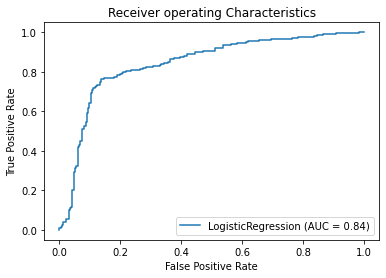

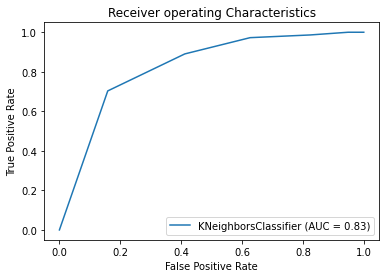

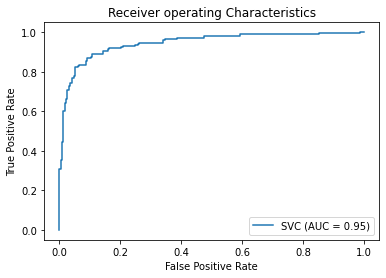

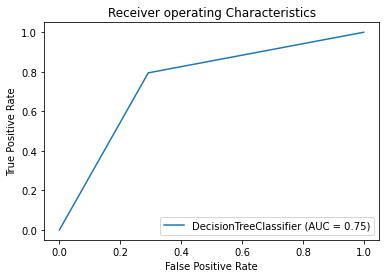

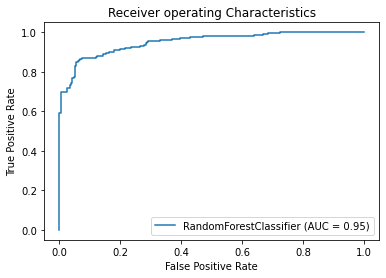

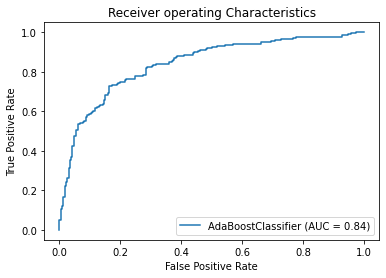

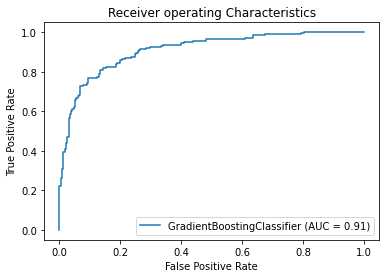

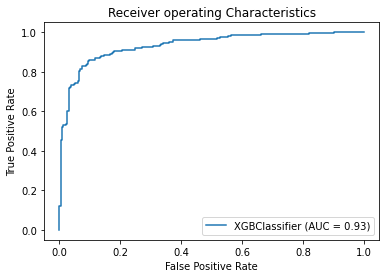

In [60]:
#lets see how well our model works on train data

model=[lg,knn,sv,dtc,rfc,ada,gd,xgb]
for m in model:
    ax=m.fit(x_train,y_train)
    plot_roc_curve(ax,x_test,y_test)
    plt.title('Receiver operating Characteristics')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
plt.show()

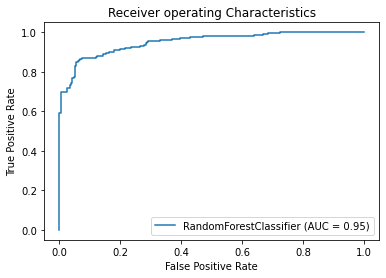

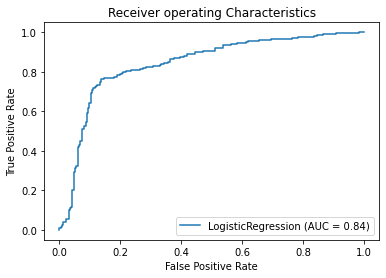

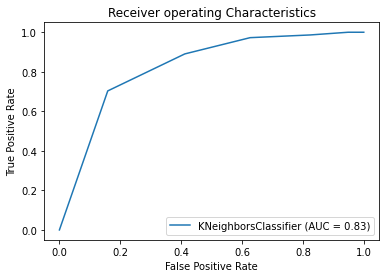

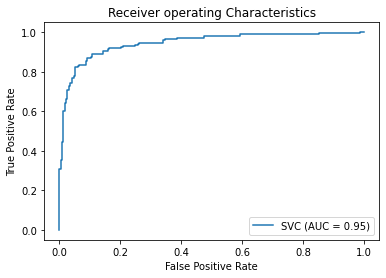

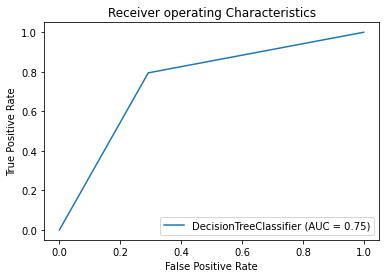

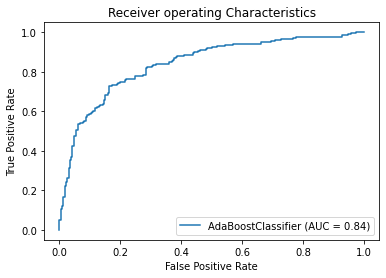

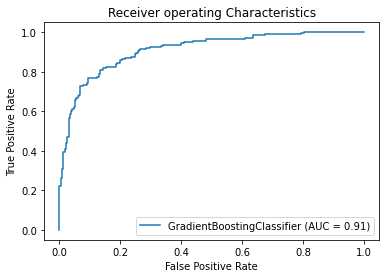

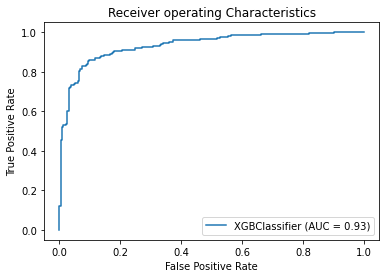

In [62]:
#lets see how well our model works on test data

model=[rfc,lg,knn,sv,dtc,ada,gd,xgb]
for m in model:
    plot_roc_curve(m,x_test,y_test)
    plt.title('Receiver operating Characteristics')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.show()

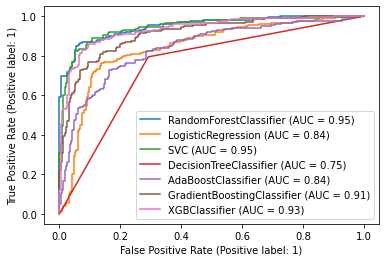

In [63]:
#combining  Roc curve of all models in to single plot

disp = plot_roc_curve(rfc,x_test,y_test)
plot_roc_curve(lg, x_test, y_test, ax=disp.ax_)     # ax_=Axes with confusion matrix
plot_roc_curve(sv, x_test, y_test, ax=disp.ax_)
plot_roc_curve(dtc, x_test, y_test, ax=disp.ax_)
plot_roc_curve(ada, x_test, y_test, ax=disp.ax_)
plot_roc_curve(gd, x_test, y_test, ax=disp.ax_)
plot_roc_curve(xgb, x_test, y_test, ax=disp.ax_)

plt.legend(prop={'size':10}, loc='lower right')
plt.show()

RandomForestClassifier Model is the final model with accuracy of 88.97%

# Conclusion

In [64]:
#saving the model
joblib.dump(rfc,"insurance_Claims_Fraud_Detection.obj")

['insurance_Claims_Fraud_Detection.obj']

In [65]:
#Lets Check loading the file 

insurance_Claims_Fraud_prediction=joblib.load("insurance_Claims_Fraud_Detection.obj")

In [68]:
pred=rfc.predict(x_test)
Conclusion=pd.DataFrame([insurance_Claims_Fraud_prediction.predict(x_test)[:],pred[:]],index=["Predicted","Original"])
Conclusion

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451
Predicted,0,0,0,0,0,1,1,1,0,0,1,1,0,0,1,1,1,1,1,1,0,1,0,1,1,1,1,1,1,0,0,0,0,0,1,1,1,1,1,0,1,1,0,0,0,1,0,0,1,0,0,0,1,1,0,1,0,0,0,1,0,0,0,1,1,0,0,1,1,1,1,0,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,1,0,1,1,0,0,0,1,0,0,1,0,0,1,1,1,1,0,1,0,0,1,1,1,0,0,0,0,0,0,1,1,1,0,0,1,1,0,1,1,0,1,0,1,0,1,1,1,0,0,0,1,1,1,1,1,0,1,0,1,1,0,0,1,0,0,0,0,1,0,1,0,1,1,1,1,1,0,0,0,0,1,1,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,0,1,1,0,0,1,1,1,0,1,1,1,1,0,0,1,0,0,1,1,0,1,1,0,1,0,1,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,1,0,1,0,1,0,1,1,0,0,1,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,1,1,0,1,1,0,1,1,0,1,0,0,1,0,0,1,1,1,1,1,1,0,1,1,0,0,0,0,0,1,0,0,1,1,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,1,1,0,1,1,0,1,1,1,1,1,0,0,0,0,0,1,0,1,1,1,0,1,0,0,1,0,1,0,1,1,1,0,1,1,1,1,0,1,1,1,1,0,0,0,0,0,0,1,1,1,0,1,1,1,0,0,1,0,1,0,0,1,0,0,0,1,1,1,0,0,0,0,1,1,1,1,1,0,1,1,1,0,0,0,1,1,0,1,1,0,0,0,0,1,0,1
Original,0,0,0,0,0,1,1,1,0,0,1,1,0,0,1,1,1,1,1,1,0,1,0,1,1,1,1,1,1,0,0,0,0,0,1,1,1,1,1,0,1,1,0,0,0,1,0,0,1,0,0,0,1,1,0,1,0,0,0,1,0,0,0,1,1,0,0,1,1,1,1,0,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,1,0,1,1,0,0,0,1,0,0,1,0,0,1,1,1,1,0,1,0,0,1,1,1,0,0,0,0,0,0,1,1,1,0,0,1,1,0,1,1,0,1,0,1,0,1,1,1,0,0,0,1,1,1,1,1,0,1,0,1,1,0,0,1,0,0,0,0,1,0,1,0,1,1,1,1,1,0,0,0,0,1,1,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,0,1,1,0,0,1,1,1,0,1,1,1,1,0,0,1,0,0,1,1,0,1,1,0,1,0,1,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,1,0,1,0,1,0,1,1,0,0,1,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,1,0,0,1,1,0,1,0,1,0,1,0,1,0,1,1,1,0,1,1,0,1,1,0,1,0,0,1,0,0,1,1,1,1,1,1,0,1,1,0,0,0,0,0,1,0,0,1,1,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,1,1,0,1,1,0,1,1,1,1,1,0,0,0,0,0,1,0,1,1,1,0,1,0,0,1,0,1,0,1,1,1,0,1,1,1,1,0,1,1,1,1,0,0,0,0,0,0,1,1,1,0,1,1,1,0,0,1,0,1,0,0,1,0,0,0,1,1,1,0,0,0,0,1,1,1,1,1,0,1,1,1,0,0,0,1,1,0,1,1,0,0,0,0,1,0,1


The jobfile created is working well and giving high accuracy.

After Training and Testing 8 algorithm model, The best accuracy model was determined as RandomForestClassifier with 88.94% true accuracy after all the data cleaning, pre-processing, training and prediction as well as evaluation phase